# Set-up:

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
from itertools import product
from string import ascii_lowercase
from random import choices
import math
import matplotlib.pyplot as plt
import datetime
%matplotlib inline

from fitter import Fitter, get_common_distributions, get_distributions
from statsmodels.stats.power import ttest_power, tt_ind_solve_power

from ml_lib.feature_store import configure_offline_feature_store
from ml_lib.feature_store.offline.client import FeatureStoreOfflineClient

from ab_testing.predictions.produce_predictions import ProducePredictions, run_ab_testing

from bayesian_testing.experiments import BinaryDataTest, DeltaLognormalDataTest

configure_offline_feature_store(workgroup="primary")

In [2]:
#      AND user_id IN (
#        SELECT user_id
#        FROM analytics__century_games_ncmgu__bingo_aloha_r3g9v.user_level_performance
#        GROUP BY user_id
#        HAVING COUNT(wins_spend) > 1
#        )
df = FeatureStoreOfflineClient.run_athena_query_pandas(
    """
    SELECT user_id
         , meta_date
         , COALESCE(SUM(spend), 0)      total_spend
         , COALESCE(SUM(wins_spend), 0) total_wins_spend
    FROM analytics__century_games_ncmgu__bingo_aloha_r3g9v.user_level_performance
    WHERE meta_date   BETWEEN DATE '2022-11-05' AND DATE '2022-12-05'
      AND fl_personalized_offer_spend <> 0
    GROUP BY 1, 2;
    """
)

target = df.total_wins_spend

2023-01-30 15:28:21,337 - botocore.credentials - INFO - Found credentials in shared credentials file: ~/.aws/credentials


Missing STATSD_HOST and/or STATSD_PORT environment variables
DummyStatsClient._send unknown.athena_query_runs_total:1|c
DummyStatsClient._send unknown.athena_query_queue_ms:100.000000|ms
DummyStatsClient._send unknown.athena_query_execution_ms:3832.000000|ms
DummyStatsClient._send unknown.athena_query_scanned_bytes:267641795|c


2023-01-30 15:28:31,931 - root - INFO - Fitted expon distribution with error=0.0058174230959940265)
2023-01-30 15:28:31,938 - root - INFO - Fitted norm distribution with error=0.02014791245018397)
2023-01-30 15:28:31,998 - root - INFO - Fitted uniform distribution with error=0.02823236874640888)
2023-01-30 15:28:32,032 - root - INFO - Fitted rayleigh distribution with error=0.018033827996621784)
2023-01-30 15:28:32,275 - root - INFO - Fitted cauchy distribution with error=0.006757818037130956)
2023-01-30 15:28:33,141 - root - INFO - Fitted chi2 distribution with error=0.0039085108646481235)
2023-01-30 15:28:33,201 - root - INFO - Fitted lognorm distribution with error=0.0038483932084005332)
2023-01-30 15:28:33,289 - root - INFO - Fitted powerlaw distribution with error=0.011493387579006453)
2023-01-30 15:28:33,353 - root - INFO - Fitted gamma distribution with error=0.003910868305272806)
2023-01-30 15:28:34,141 - root - INFO - Fitted exponpow distribution with error=0.00568797301887378

{'lognorm': {'s': 1.5110479880334873,
  'loc': 0.7101225000356752,
  'scale': 5.043546432677584}}

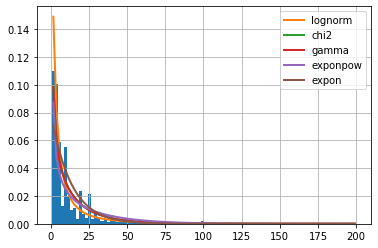

In [3]:
f = Fitter(target, distributions=get_common_distributions())
f.fit()
f.summary()
f.get_best(method="sumsquare_error")

# Simulations:

All users:
* Data conversion rate ~ 2%
* Data shape           ~ 1.5 
* Data location        ~ 0.7
* Data scale           ~ 5.0

E(n_users/day) = 50k, 35k per class / day

### Sims - Set Up:

In [69]:
def freq_counts(
    name: str
) -> list:
    temp_path = "./sims_data/" + name + ".pkl"
    temp = pd.read_pickle(temp_path)
    l = []
    for row in temp.itertuples(index=True, name='Pandas'):
        if (row.con_p or row.rev_p) and (row.con_c or row.rev_c):
            l.append(row.revenue_win)
        elif (row.con_p or row.rev_p):
            l.append("p")
        elif (row.con_c or row.rev_c):
            l.append("c")
        else:
            l.append(row.revenue_win)
    unique, counts = np.unique(np.asarray(l), return_counts=True)
    return(np.asarray((unique, counts)).T)

In [4]:
def get_data(
    n_daily_users: int,
    n_days: int,
    true_conv_rate: int,
    true_mean_of_logs_of_spend: int,
    true_variance_of_logs_of_spend: int,
    test_gr: str,
) -> pd.DataFrame:
    meta_dts = [[x] * n_daily_users for x in range(1, n_days + 1)]
    meta_dts = [item for sublist in meta_dts for item in sublist]
    data_binom = np.random.binomial(1, true_conv_rate, n_daily_users * n_days).astype(
        float
    )
    data_revenue = np.random.lognormal(
        true_mean_of_logs_of_spend,
        np.sqrt(true_variance_of_logs_of_spend),
        n_daily_users * n_days,
    )
    
    return pd.DataFrame(
        data = {
            "meta_date": np.array(meta_dts),
            "test_group": np.array([test_gr] * n_daily_users * n_days),
            "total_wins_spend": np.multiply(data_binom, data_revenue),
        }
    )

In [5]:
def eval_data(
    true_conv_rate: int,
    true_mean_of_logs_of_spend: int,
    true_variance_of_logs_of_spend: int,
    con_multi: int,
    rev_multi: int,
    n_daily_users: int,
    split_ratio: int,
    n_days: int,
    stop_rule_con: int,
    stop_rule_rev: int,
    trial: int,
) -> list:
    df_c = get_data(
        n_daily_users = int(n_daily_users*split_ratio),
        n_days = n_days,
        true_conv_rate = true_conv_rate,
        true_mean_of_logs_of_spend = true_mean_of_logs_of_spend,
        true_variance_of_logs_of_spend = true_variance_of_logs_of_spend,
        test_gr = "c"
    )
    df_p = get_data(
        n_daily_users = n_daily_users-int(n_daily_users*split_ratio),
        n_days = n_days,
        true_conv_rate = true_conv_rate * con_multi,
        true_mean_of_logs_of_spend = true_mean_of_logs_of_spend + np.log(rev_multi),
        true_variance_of_logs_of_spend = true_variance_of_logs_of_spend,
        test_gr = "p"
    )
    df = pd.concat([df_c, df_p])
    
    con_results = []
    rev_results = []

    for day in range(1, n_days + 1):
        result = ProducePredictions()
        results_con = result.produce_results_conversion(
            df[df['meta_date'] <= day]
        )
        results_rev = result.produce_results_revenue(
            "lognorm",
            df[df['meta_date'] <= day]
        )

        id_p, id_c = 0, 1
        con_results.append(
            [
                trial,
                day,
                results_con[id_p]["prob_being_best"],
                results_con[id_p]["expected_loss"],
                results_con[id_c]["prob_being_best"],
                results_con[id_c]["expected_loss"],
            ]
        )
        rev_results.append(
            [
                trial,
                day,
                results_rev[id_p]["prob_being_best"],
                results_rev[id_p]["expected_loss"],
                results_rev[id_c]["prob_being_best"],
                results_rev[id_c]["expected_loss"],
            ]
        )
        
        if (
            (day >= 7) and
            (
                (results_con[id_p]["expected_loss"] <= stop_rule_con) or
                (results_con[id_c]["expected_loss"] <= stop_rule_con) or
                (results_rev[id_p]["expected_loss"] <= stop_rule_rev) or
                (results_rev[id_c]["expected_loss"] <= stop_rule_rev)
            )
           ):
            spend_by_group = df[df['meta_date'] <= day].groupby("test_group").sum().total_wins_spend
            count_by_group = df[df['meta_date'] == 1].groupby("test_group").count().meta_date
            arpu_by_group  = spend_by_group/count_by_group
            what_stop = {
                "trial":trial,
                "day":day,
                "con_p":(float(results_con[id_p]["expected_loss"]) <= stop_rule_con),
                "con_c":(float(results_con[id_c]["expected_loss"]) <= stop_rule_con),
                "rev_p":(float(results_rev[id_p]["expected_loss"]) <= stop_rule_rev),
                "rev_c":(float(results_rev[id_c]["expected_loss"]) <= stop_rule_rev),
                "revenue_win":arpu_by_group.idxmax(),
                "time":False,
            }
            return [con_results, rev_results, what_stop]
            # Maybe when_stop as parameter... (& cont. running)
    what_stop = {
        "trial":trial,
        "day":day,
        "con_p":False,
        "con_c":False,
        "rev_p":False,
        "rev_c":False,
        "revenue_win":"time",
        "time":True,
    }
    return [con_results, rev_results, what_stop]

In [6]:
l1 = []
l2 = []
for i in range(0, 10):
    data_revenue = np.random.lognormal(1.8, np.sqrt(2), 100000000)
    data_all = np.random.binomial(1, 0.03, 100000000).astype(float)
    data_all[data_all > 0] = data_revenue[data_all > 0]
    print(round(np.mean(data_all), 4), round(np.std(data_all), 4))
    l1.append(np.mean(data_all))
    l2.append(np.std(data_all))

print()
print(round(np.mean(l1), 4), round(np.mean(l2), 4))

0.493 7.7678
0.4942 7.745
0.4936 7.804
0.4932 7.7122
0.493 7.5649
0.4923 7.697
0.4935 7.6934
0.4924 7.6916
0.4936 7.7192
0.4929 7.7493

0.4932 7.7145


In [119]:
def get_all(
    n_trials:int,
    stop_rule_con:float,
    stop_rule_rev:float,
    con_multi:float,
    rev_multi:float,
    n_days: int = 30,
    verbose:bool = True,
    verbose_num: int = 5,
) -> list:
    con_res = pd.DataFrame(
        None,
        columns=[
            "trial",
            "day",
            "prob_being_best_p",
            "expected_loss_p",
            "prob_being_best_c",
            "expected_loss_c",
        ],
    )
    rev_res = pd.DataFrame(
        None,
        columns=[
            "trial",
            "day",
            "prob_being_best_p",
            "expected_loss_p",
            "prob_being_best_c",
            "expected_loss_c",
        ],
    )
    stop_res = pd.DataFrame(
        None,
        columns=[
            "trial",
            "day",
            "con_p",
            "con_c",
            "rev_p",
            "rev_c",
            "revenue_win",
            "time",
        ],
    )

    for trial in range(0, n_trials):
        temp_trial = eval_data(
            true_conv_rate=0.03,
            true_mean_of_logs_of_spend=1.8,
            true_variance_of_logs_of_spend=np.sqrt(2),
            con_multi=con_multi,
            rev_multi=rev_multi,
            n_daily_users=10000,
            split_ratio=0.5,
            n_days=n_days,
            stop_rule_con=stop_rule_con,
            stop_rule_rev=stop_rule_rev,
            trial=trial,
        )
        
        temp_con_res = pd.DataFrame(
            temp_trial[0],
            columns=[
                "trial",
                "day",
                "prob_being_best_p",
                "expected_loss_p",
                "prob_being_best_c",
                "expected_loss_c",
            ],
        )
        temp_rev_res = pd.DataFrame(
            temp_trial[1],
            columns=[
                "trial",
                "day",
                "prob_being_best_p",
                "expected_loss_p",
                "prob_being_best_c",
                "expected_loss_c",
            ],
        )
        temp_stop_res = pd.DataFrame(
            temp_trial[2],
            columns=[
                "trial",
                "day",
                "con_p",
                "con_c",
                "rev_p",
                "rev_c",
                "revenue_win",
                "time",
            ],
            index = [trial],
        )
        
        con_res = pd.concat([con_res, temp_con_res], ignore_index=True)
        rev_res = pd.concat([rev_res, temp_rev_res], ignore_index=True)
        stop_res = pd.concat([stop_res, temp_stop_res], ignore_index=True)
        
        if verbose == True:
            if trial % verbose_num == 0:
                print("Trial" , str(trial) + "/" + str(n_trials))
    
    return([con_res, rev_res, stop_res])

def get_min_sample_size(
    exp_uplift: float,
    split_ratio: float,
    alpha: float = 0.1,
    power: float = 0.9,
    data_avg: float = 0.5,
    data_var: float = 7.8,
) -> int:
    return tt_ind_solve_power(
        # numbers come from analysis above
        # 0.1 represents E(Uplift) = 10%
        effect_size = data_avg*exp_uplift/data_var,
        alpha = alpha,
        power = power,
        ratio = split_ratio/(1-split_ratio),
        alternative = 'two-sided'
    )

def plot_results(
    df_res: pd.DataFrame,
    name: str,
    stop_rule: float,
    exp_uplift: float = 0.1,
    split_ratio: float = 0.5,
    n_days: int = 30,
    n_daily_users: int = 10000,
):
    min_sample_size = get_min_sample_size(
        exp_uplift = exp_uplift,
        split_ratio = split_ratio,
    )
    stop_freq = np.ceil(min_sample_size/n_daily_users)
    
    fig, axes = plt.subplots(nrows = 2, ncols = 2)
    plt.rcParams["figure.figsize"] = (20,11)
    stop_freq_text = "t.test:\n" + str(stop_freq) + " days"
    

    df_res.pivot(index = "day", columns = "trial", values = ["prob_being_best_p"]).plot(legend=None, ax = axes[0, 0], title = "P(P>C) by Trial", linewidth = 0.5)
    axes[0,0].axhline(y = 0.5, color = 'black', linewidth = 1.5)
    if stop_freq < n_days*2:
        axes[0,0].axvline(x = stop_freq, color = 'plum', linestyle = '--', linewidth = 1.5)
    plt.text(.9, .95, stop_freq_text, ha='left', va='top', transform = axes[0,0].transAxes)
    
    df_res.assign(index=df_res.groupby('day').cumcount()).pivot('index','day','prob_being_best_p').plot(
        kind='box',
        legend=None,
        ax = axes[0,1],
        title = name + "Test: P(P>C) by Day"
    )
    axes[0,1].axhline(y = 0.5, color = 'black', linewidth = 0.75)
    if stop_freq < n_days*2:
        axes[0,1].axvline(x = stop_freq, color = 'plum', linestyle = '--', linewidth = 1.5)
    plt.text(.9, .95, stop_freq_text, ha='left', va='top', transform = axes[0,1].transAxes)
    
    df_res.pivot(index = "day", columns = "trial", values = ["expected_loss_p"]).plot(legend=None, ax = axes[1, 0], title = "E(Loss | P chosen) by Trial", linewidth = 0.5)
    axes[1,0].axhline(y = stop_rule, color = 'black', linewidth = 1.5)
    if stop_freq < n_days*2:
        axes[1,0].axvline(x = stop_freq, color = 'plum', linestyle = '--', linewidth = 1.5)
    plt.text(.9, .95, stop_freq_text, ha='left', va='top', transform = axes[1,0].transAxes)
    
    df_res.pivot(index = "day", columns = "trial", values = ["expected_loss_c"]).plot(legend=None, ax = axes[1, 1], title = "E(Loss | C chosen) by Trial", linewidth = 0.5)
    axes[1,1].axhline(y = stop_rule, color = 'black', linewidth = 1.5)
    if stop_freq < n_days*2:
        axes[1,1].axvline(x = stop_freq, color = 'plum', linestyle = '--', linewidth = 1.5)
    plt.text(.9, .95, stop_freq_text, ha='left', va='top', transform = axes[1,1].transAxes)
    
    temp_title = 'Results ' + name + ' Test:'
    fig.suptitle(temp_title)
    plt.show()

### Sims - Constants:

In [8]:
# Question 7: Investigate if stopping rule is same or not...
stop_rule_con = 0.00001
stop_rule_rev = 0.0005

### Sims - Null:

In [13]:
c_nU_nU_nostop = get_all(
    n_trials = 50,
    stop_rule_con = 0,
    stop_rule_rev = 0,
    con_multi = 1,
    rev_multi = 1,
    n_days = 100,
)

Trial 0/50
Trial 5/50
Trial 10/50
Trial 15/50
Trial 20/50
Trial 25/50
Trial 30/50
Trial 35/50
Trial 40/50
Trial 45/50


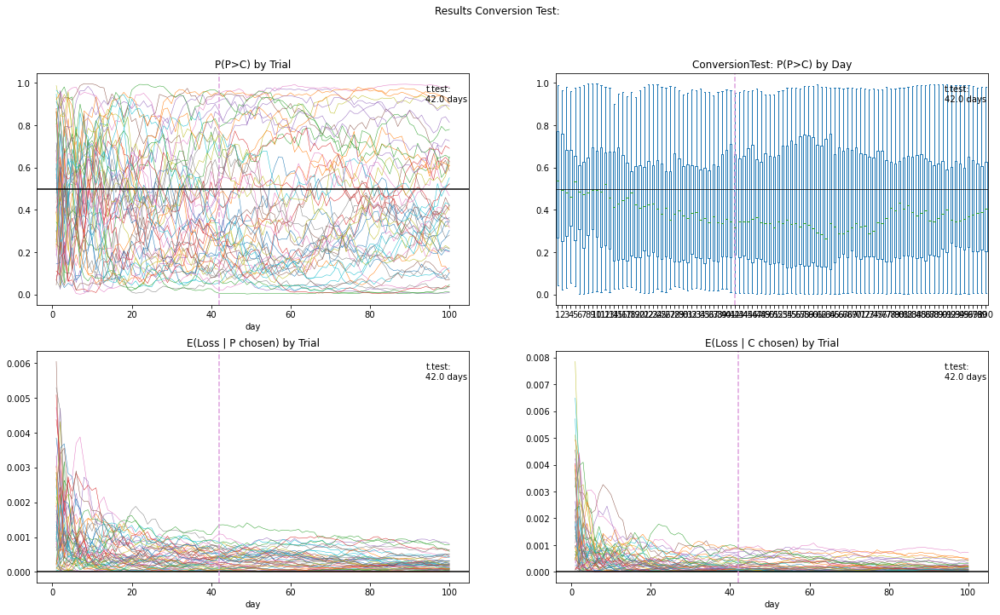

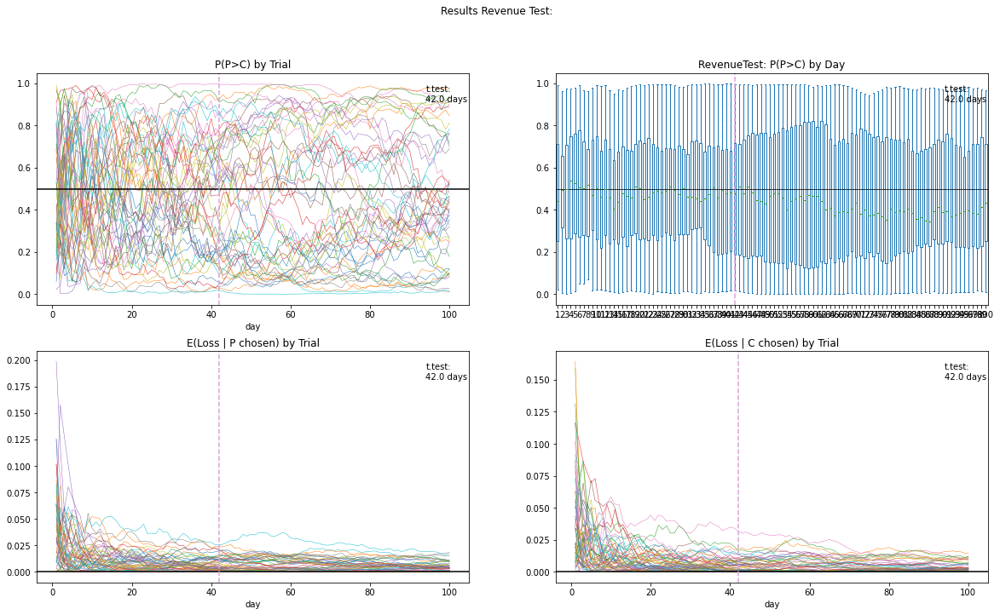

time    50
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,NaN,NaN,NaN,NaN,1.0
False,1.0,1.0,1.0,1.0,NaN


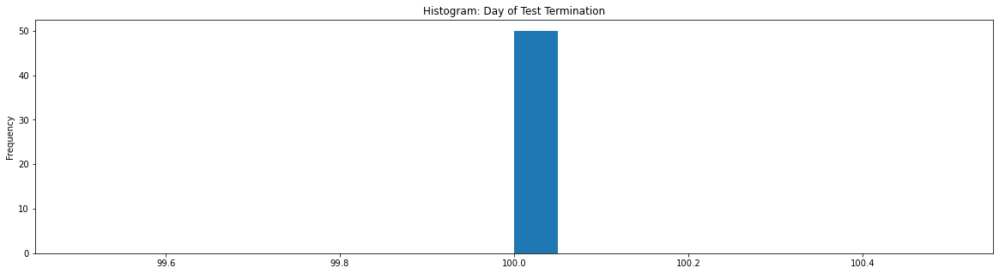

In [14]:
c_nU_nU_nostop[2].to_pickle("./sims_data/c_nU_nU_nostop.pkl")
# c_nU_nU_nostop = pd.read_pickle("./sims_data/c_nU_nU_nostop.pkl")

plot_results(c_nU_nU_nostop[0], "Conversion", stop_rule_con)
plot_results(c_nU_nU_nostop[1], "Revenue", stop_rule_rev)
c_nU_nU_nostop[2].day.plot(kind = "hist", bins = 20, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_nU_nostop[2].revenue_win.value_counts())
c_nU_nU_nostop[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).sort_index(ascending=False)/50

# Question 5: try min_sample_size for 
#             To begin I ran an A/A test comparing a sales process with a 5% conversion rate
#             and a mean of 25$ revenue/sale. In this example, the standard deviation of the
#             data is $5.6 (compared to a mean revenue/visitor of $1.25)

In [8]:
c_nU_nU = get_all(
    n_trials = 100,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1,
    n_days = 60,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


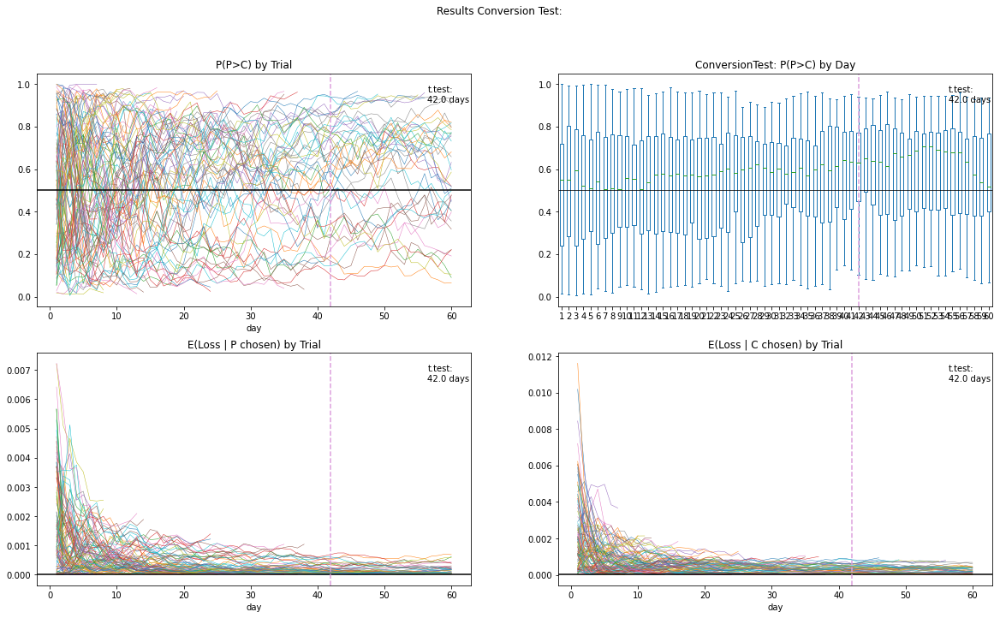

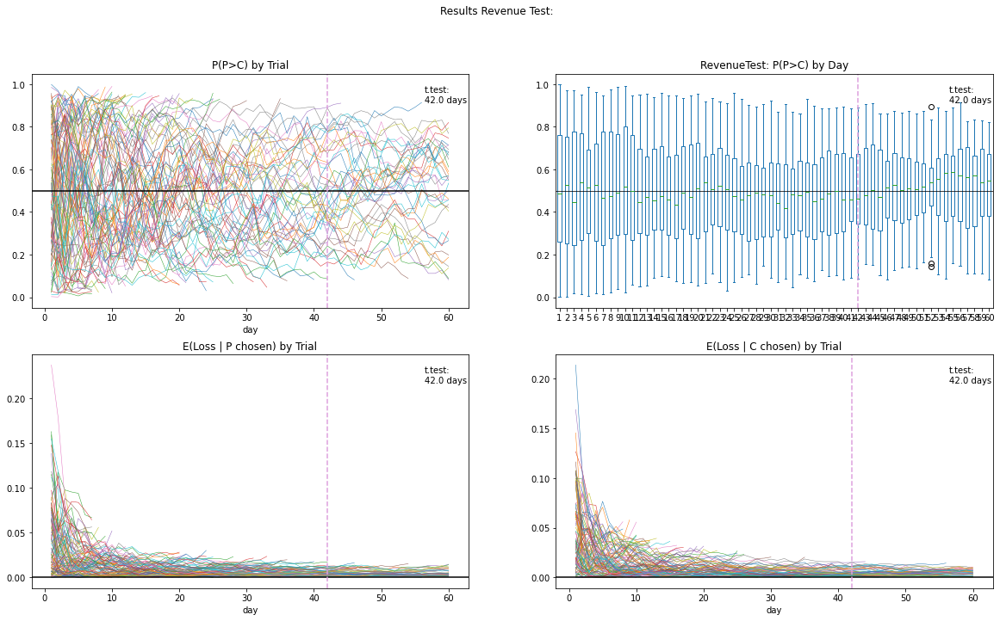

p       35
time    34
c       31
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.13,0.06,0.25,0.23,0.34
False,0.87,0.94,0.75,0.77,0.66


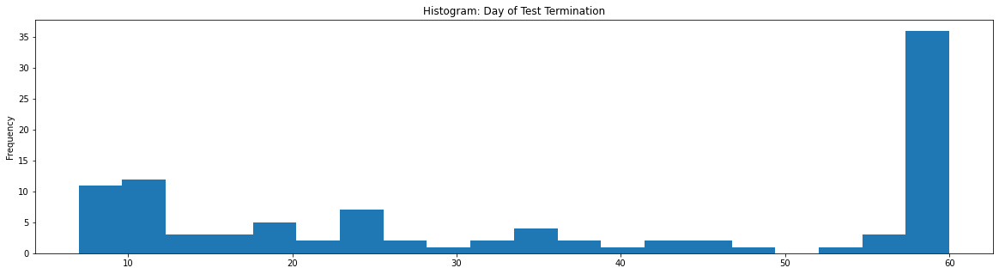

In [10]:
c_nU_nU[2].to_pickle("./sims_data/c_nU_nU.pkl")
# c_nU_nU = pd.read_pickle("./sims_data/c_nU_nU.pkl")

plot_results(c_nU_nU[0], "Conversion", stop_rule_con)
plot_results(c_nU_nU[1], "Revenue", stop_rule_rev)
c_nU_nU[2].day.plot(kind = "hist", bins = 20, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_nU[2].revenue_win.value_counts())
c_nU_nU[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).sort_index(ascending=False)/100

# Question 5: try min_sample_size for 
#             To begin I ran an A/A test comparing a sales process with a 5% conversion rate
#             and a mean of 25$ revenue/sale. In this example, the standard deviation of the
#             data is $5.6 (compared to a mean revenue/visitor of $1.25)

### Sims - Conversion:

In [196]:
c_yU_nU_1 = get_all(
    n_trials = 50,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1.025,
    rev_multi = 1,
)

Trial 0/50
Trial 5/50
Trial 10/50
Trial 15/50
Trial 20/50
Trial 25/50
Trial 30/50
Trial 35/50
Trial 40/50
Trial 45/50


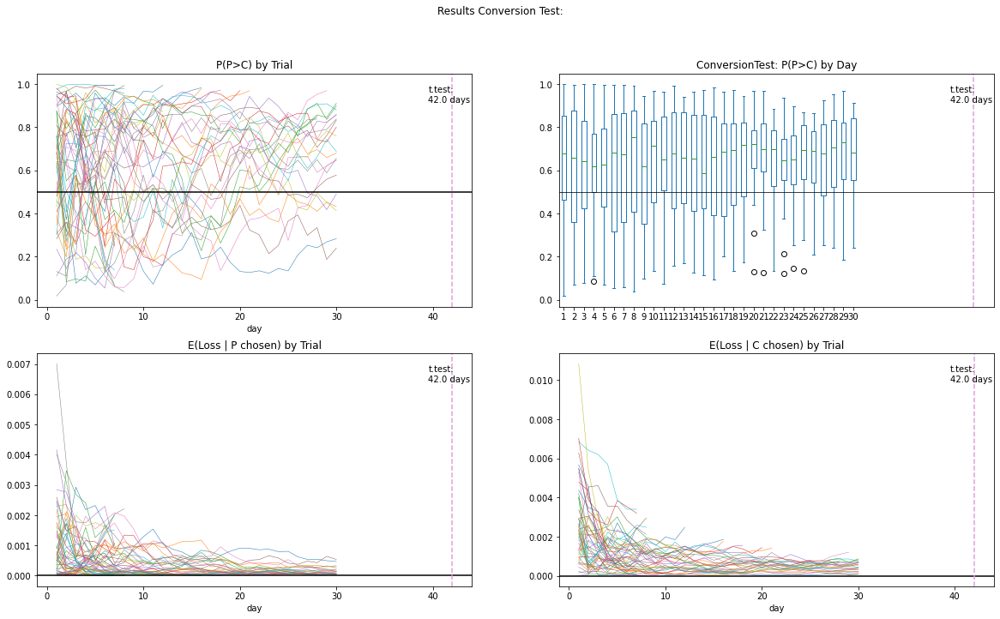

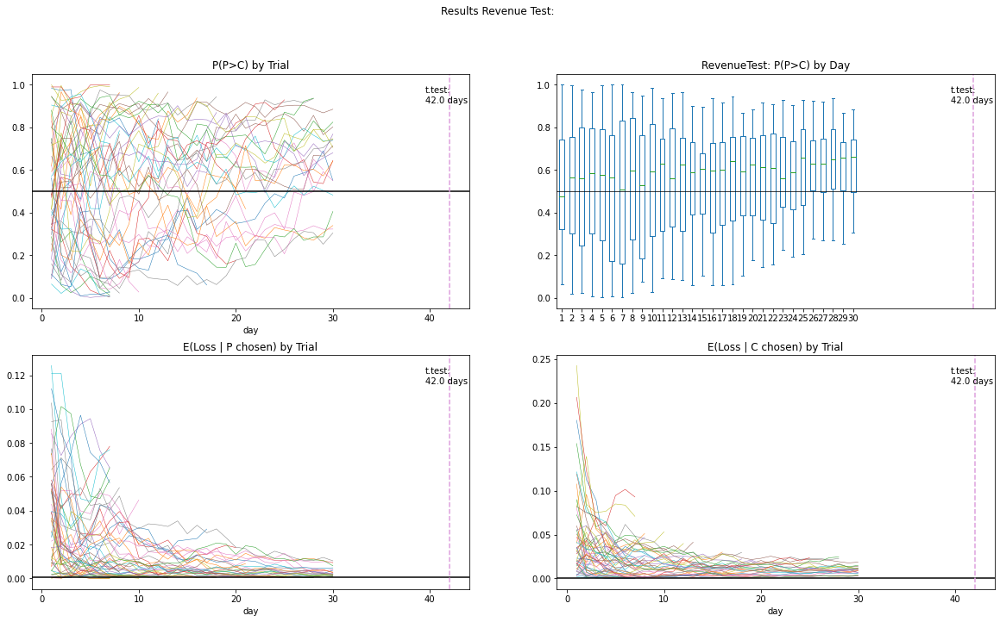

time    20
p       18
c       12
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.22,0.0,0.22,0.18,0.4
False,0.78,1.0,0.78,0.82,0.6


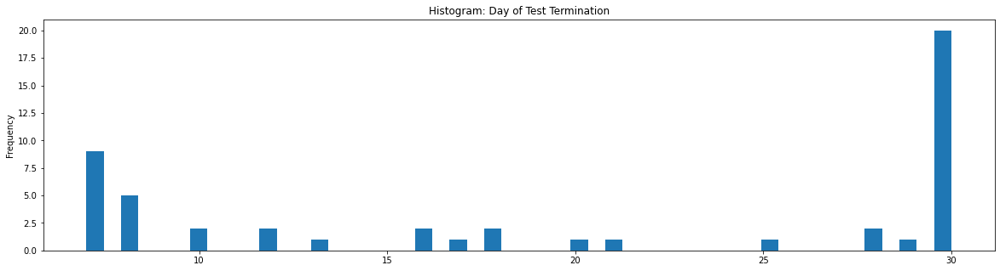

In [197]:
c_yU_nU_1[2].to_pickle("./sims_data/c_yU_nU_1.pkl")
# c_yU_nU_1 = pd.read_pickle("./sims_data/c_yU_nU_1.pkl")

plot_results(c_yU_nU_1[0], "Conversion", stop_rule_con)
plot_results(c_yU_nU_1[1], "Revenue", stop_rule_rev)
c_yU_nU_1[2].day.plot(kind = "hist", bins = 50, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_yU_nU_1[2].revenue_win.value_counts())
c_yU_nU_1[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/50

In [198]:
c_yU_nU_2 = get_all(
    n_trials = 50,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1.05,
    rev_multi = 1,
)

Trial 0/50
Trial 5/50
Trial 10/50
Trial 15/50
Trial 20/50
Trial 25/50
Trial 30/50
Trial 35/50
Trial 40/50
Trial 45/50


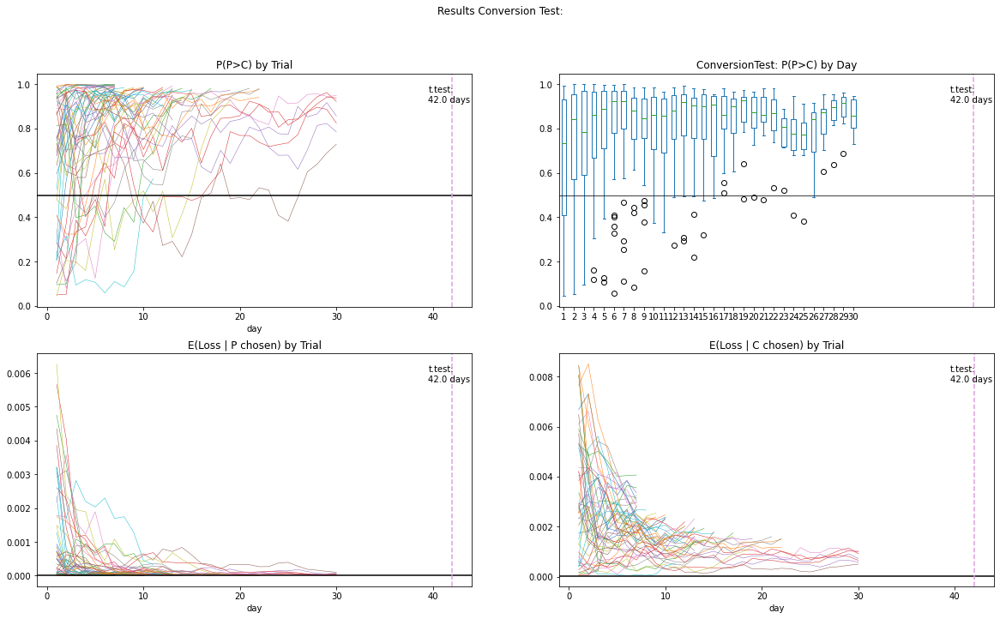

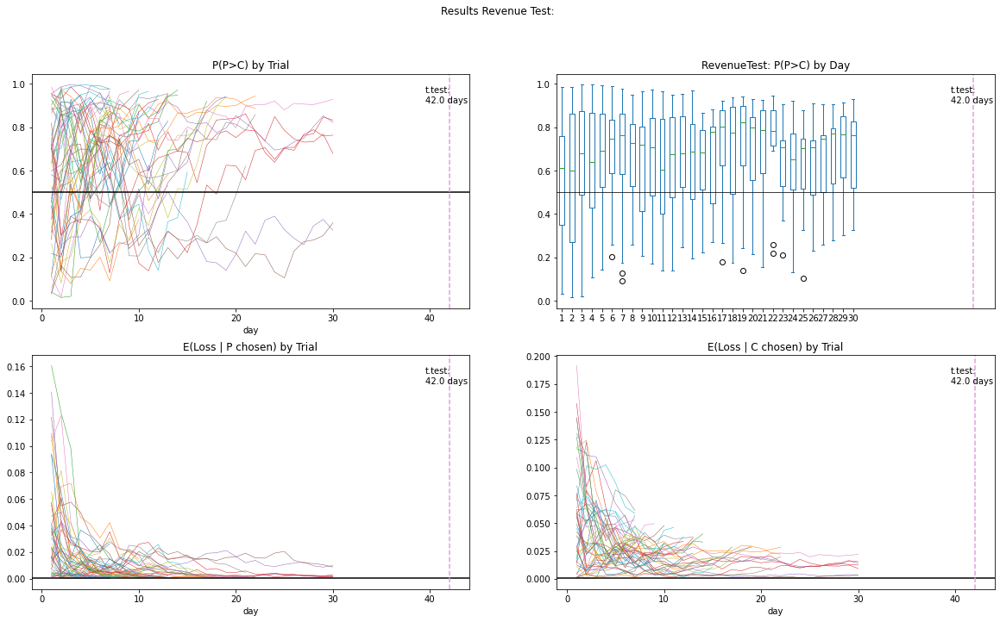

p       41
time     6
c        3
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.66,0.0,0.3,0.0,0.12
False,0.34,1.0,0.7,1.0,0.88


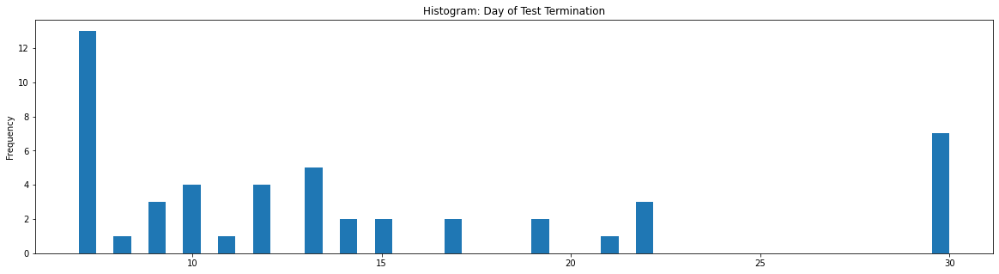

In [199]:
c_yU_nU_2[2].to_pickle("./sims_data/c_yU_nU_2.pkl")
# c_yU_nU_2 = pd.read_pickle("./sims_data/c_yU_nU_2.pkl")

plot_results(c_yU_nU_2[0], "Conversion", stop_rule_con)
plot_results(c_yU_nU_2[1], "Revenue", stop_rule_rev)
c_yU_nU_2[2].day.plot(kind = "hist", bins = 50, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_yU_nU_2[2].revenue_win.value_counts())
c_yU_nU_2[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/50

In [200]:
c_yU_nU_3 = get_all(
    n_trials = 50,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1.1,
    rev_multi = 1,
)

Trial 0/50
Trial 5/50
Trial 10/50
Trial 15/50
Trial 20/50
Trial 25/50
Trial 30/50
Trial 35/50
Trial 40/50
Trial 45/50


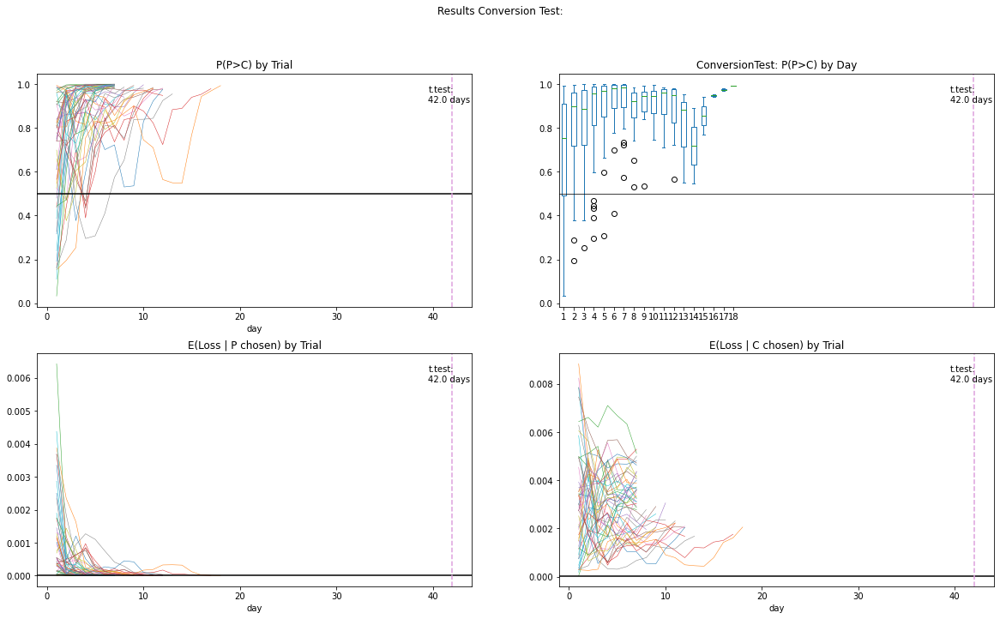

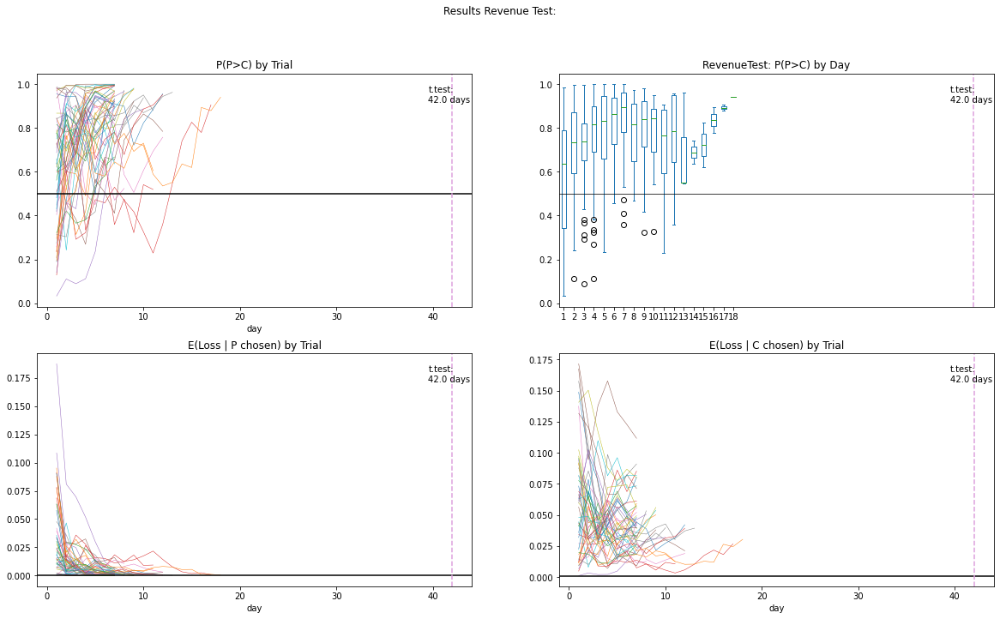

p    48
c     2
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.84,0.0,0.46,0.0,0.0
False,0.16,1.0,0.54,1.0,1.0


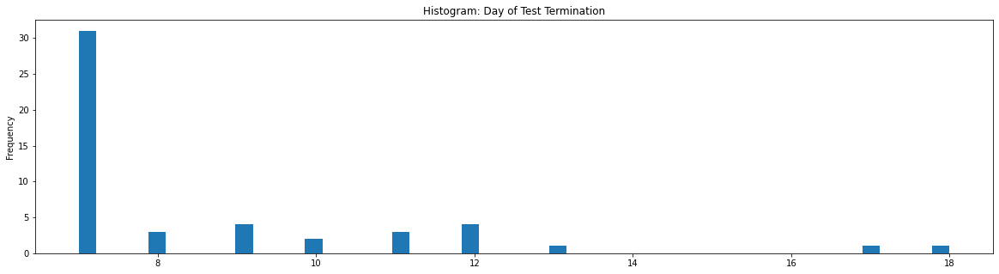

In [201]:
c_yU_nU_3[2].to_pickle("./sims_data/c_yU_nU_3.pkl")
# c_yU_nU_3 = pd.read_pickle("./sims_data/c_yU_nU_3.pkl")

plot_results(c_yU_nU_3[0], "Conversion", stop_rule_con)
plot_results(c_yU_nU_3[1], "Revenue", stop_rule_rev)
c_yU_nU_3[2].day.plot(kind = "hist", bins = 50, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_yU_nU_3[2].revenue_win.value_counts())
c_yU_nU_3[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/50

In [202]:
c_yU_nU_4 = get_all(
    n_trials = 50,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1.15,
    rev_multi = 1,
)

Trial 0/50
Trial 5/50
Trial 10/50
Trial 15/50
Trial 20/50
Trial 25/50
Trial 30/50
Trial 35/50
Trial 40/50
Trial 45/50


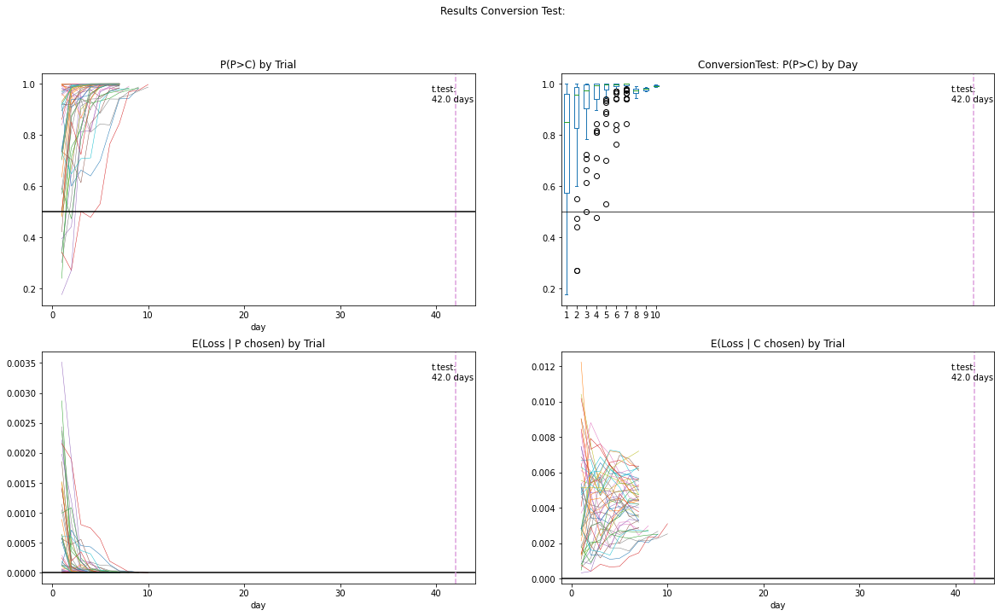

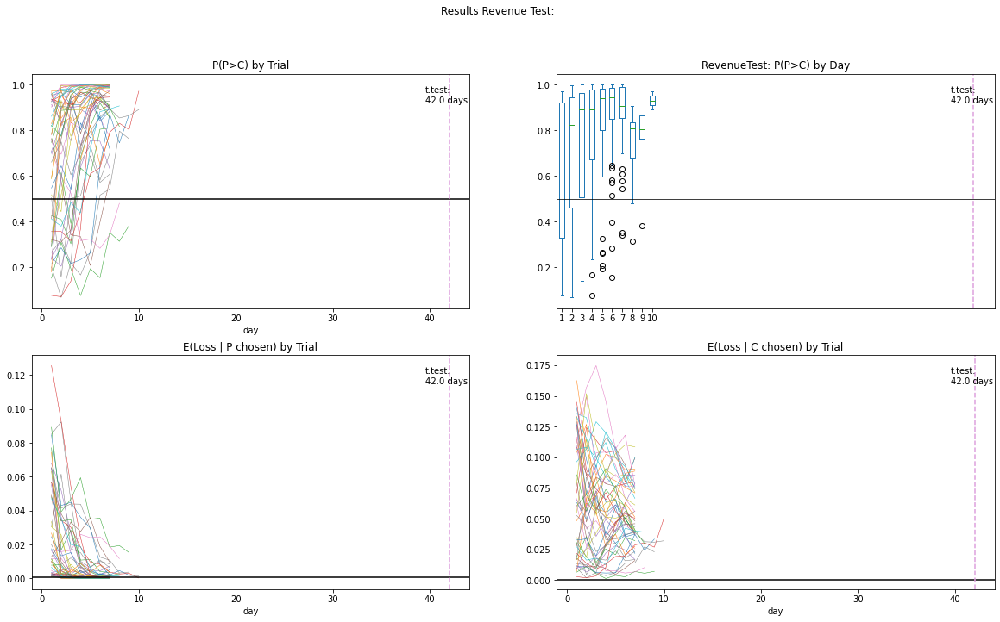

p    48
c     2
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,1.0,0.0,0.42,0.0,0.0
False,0.0,1.0,0.58,1.0,1.0


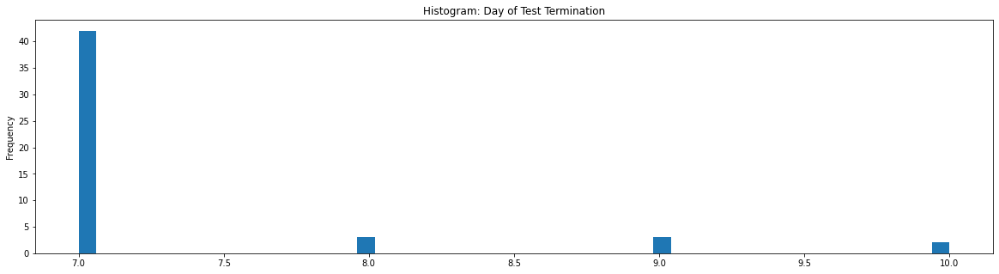

In [203]:
c_yU_nU_4[2].to_pickle("./sims_data/c_yU_nU_4.pkl")
# c_yU_nU_4 = pd.read_pickle("./sims_data/c_yU_nU_4.pkl")

plot_results(c_yU_nU_4[0], "Conversion", stop_rule_con)
plot_results(c_yU_nU_4[1], "Revenue", stop_rule_rev)
c_yU_nU_4[2].day.plot(kind = "hist", bins = 50, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_yU_nU_4[2].revenue_win.value_counts())
c_yU_nU_4[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/50

### Sims - Revenue:

In [204]:
c_nU_yU_1 = get_all(
    n_trials = 50,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1.025,
)

Trial 0/50
Trial 5/50
Trial 10/50
Trial 15/50
Trial 20/50
Trial 25/50
Trial 30/50
Trial 35/50
Trial 40/50
Trial 45/50


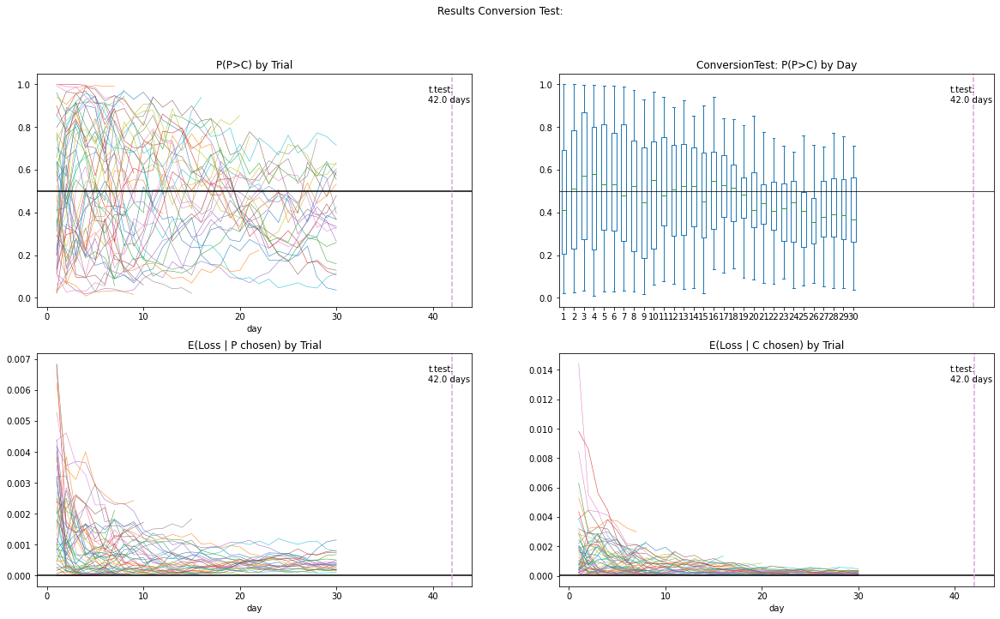

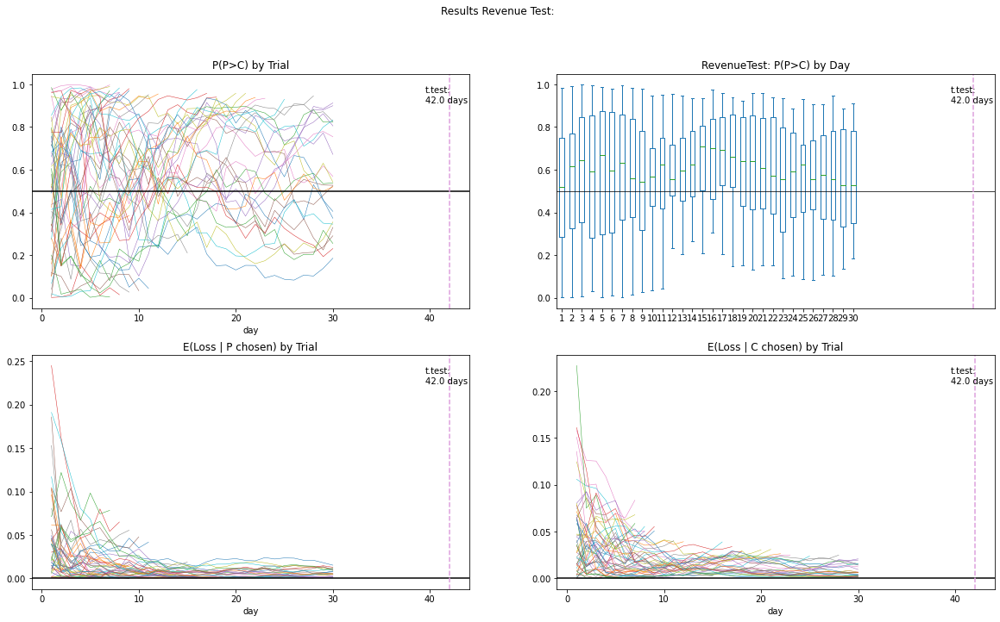

time    22
p       20
c        8
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.02,0.06,0.38,0.1,0.44
False,0.98,0.94,0.62,0.9,0.56


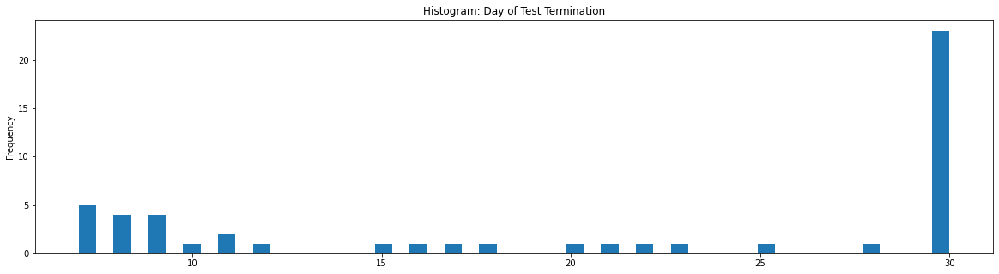

In [205]:
c_nU_yU_1[2].to_pickle("./sims_data/c_nU_yU_1.pkl")
# c_nU_yU_1 = pd.read_pickle("./sims_data/c_nU_yU_1.pkl")

plot_results(c_nU_yU_1[0], "Conversion", stop_rule_con)
plot_results(c_nU_yU_1[1], "Revenue", stop_rule_rev)
c_nU_yU_1[2].day.plot(kind = "hist", bins = 50, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_yU_1[2].revenue_win.value_counts())
c_nU_yU_1[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/50

In [206]:
c_nU_yU_2 = get_all(
    n_trials = 50,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1.05,
)

Trial 0/50
Trial 5/50
Trial 10/50
Trial 15/50
Trial 20/50
Trial 25/50
Trial 30/50
Trial 35/50
Trial 40/50
Trial 45/50


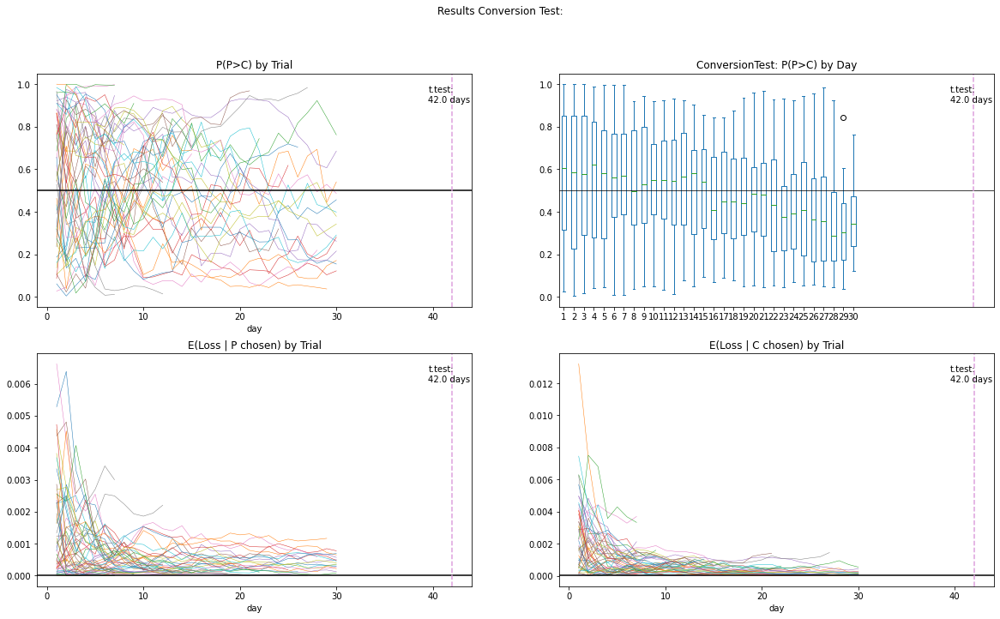

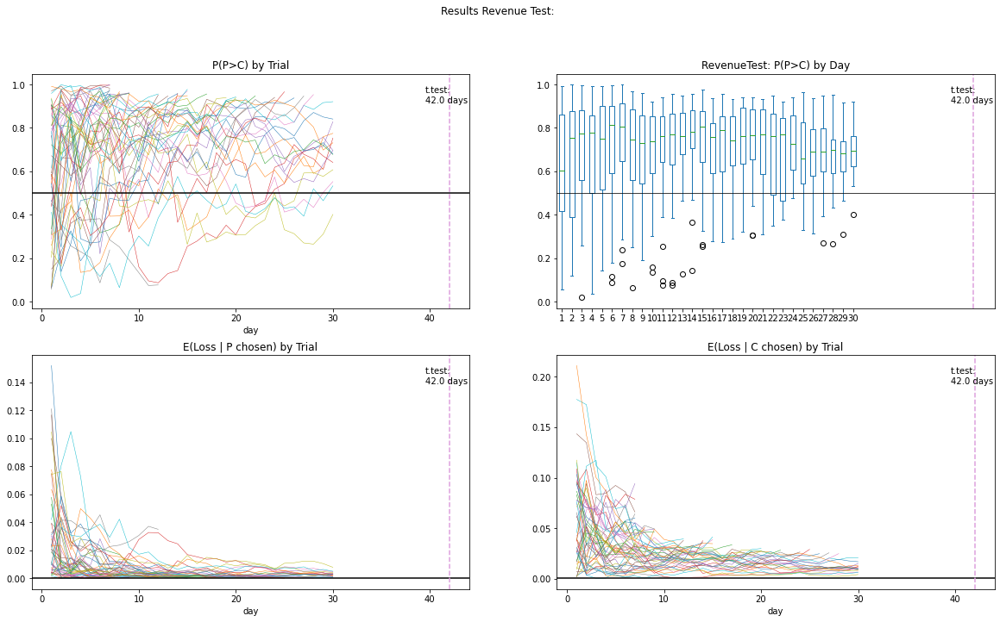

p       32
time    15
c        3
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.08,0.06,0.58,0.0,0.3
False,0.92,0.94,0.42,1.0,0.7


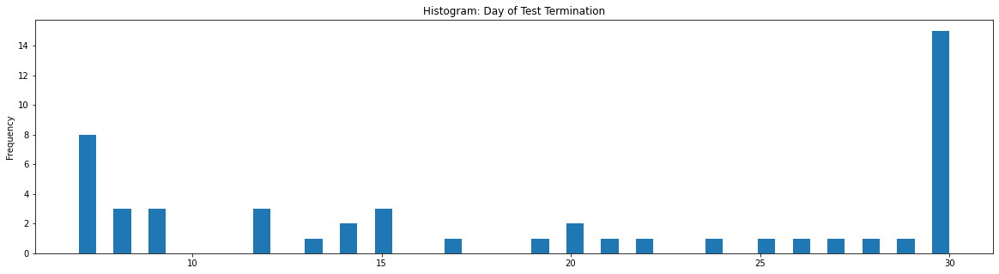

In [207]:
c_nU_yU_2[2].to_pickle("./sims_data/c_nU_yU_2.pkl")
# c_nU_yU_2 = pd.read_pickle("./sims_data/c_nU_yU_2.pkl")

plot_results(c_nU_yU_2[0], "Conversion", stop_rule_con)
plot_results(c_nU_yU_2[1], "Revenue", stop_rule_rev)
c_nU_yU_2[2].day.plot(kind = "hist", bins = 50, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_yU_2[2].revenue_win.value_counts())
c_nU_yU_2[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/50

In [208]:
c_nU_yU_3 = get_all(
    n_trials = 50,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1.1,
)

Trial 0/50
Trial 5/50
Trial 10/50
Trial 15/50
Trial 20/50
Trial 25/50
Trial 30/50
Trial 35/50
Trial 40/50
Trial 45/50


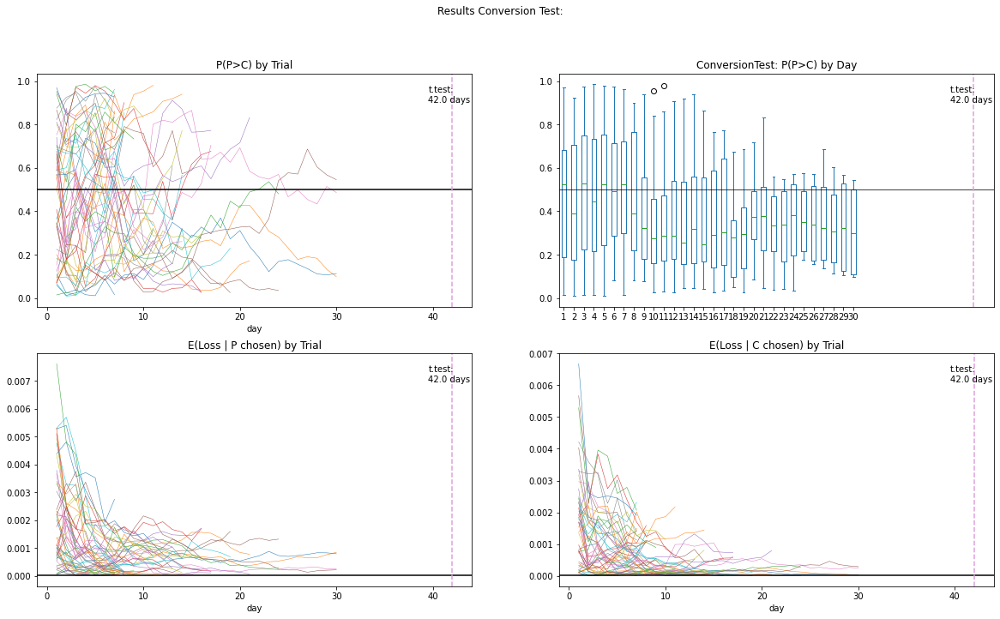

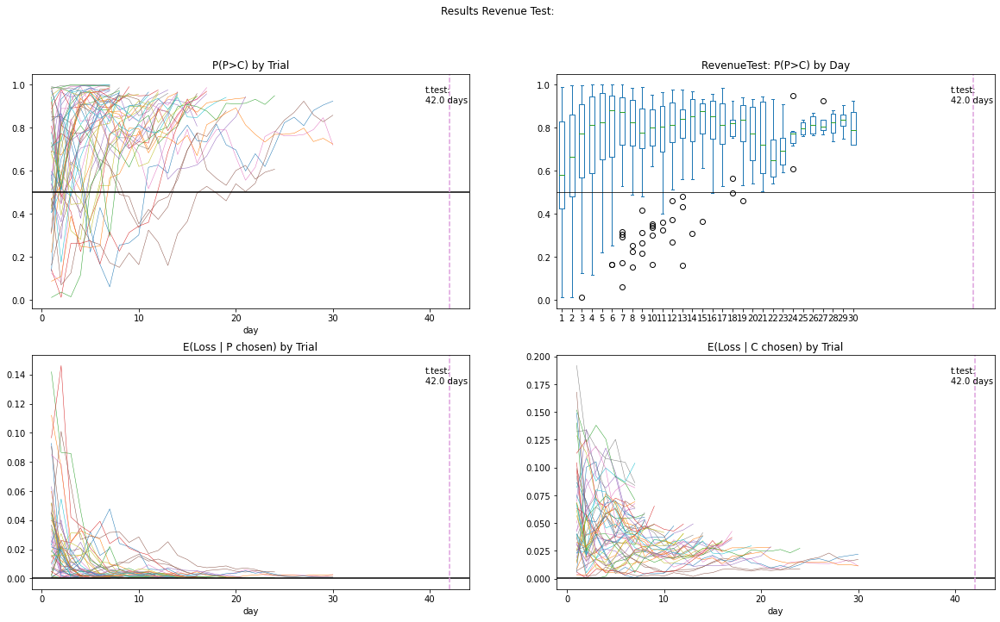

p       45
time     4
c        1
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.02,0.1,0.8,0.0,0.08
False,0.98,0.9,0.2,1.0,0.92


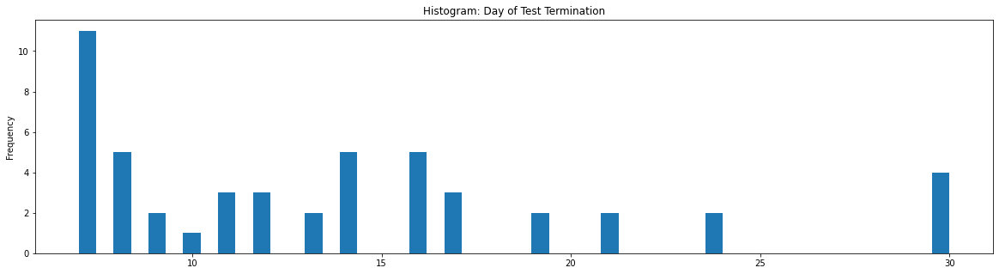

In [209]:
c_nU_yU_3[2].to_pickle("./sims_data/c_nU_yU_3.pkl")
# c_nU_yU_3 = pd.read_pickle("./sims_data/c_nU_yU_3.pkl")

plot_results(c_nU_yU_3[0], "Conversion", stop_rule_con)
plot_results(c_nU_yU_3[1], "Revenue", stop_rule_rev)
c_nU_yU_3[2].day.plot(kind = "hist", bins = 50, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_yU_3[2].revenue_win.value_counts())
c_nU_yU_3[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/50

In [210]:
c_nU_yU_4 = get_all(
    n_trials = 50,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1.15,
)

Trial 0/50
Trial 5/50
Trial 10/50
Trial 15/50
Trial 20/50
Trial 25/50
Trial 30/50
Trial 35/50
Trial 40/50
Trial 45/50


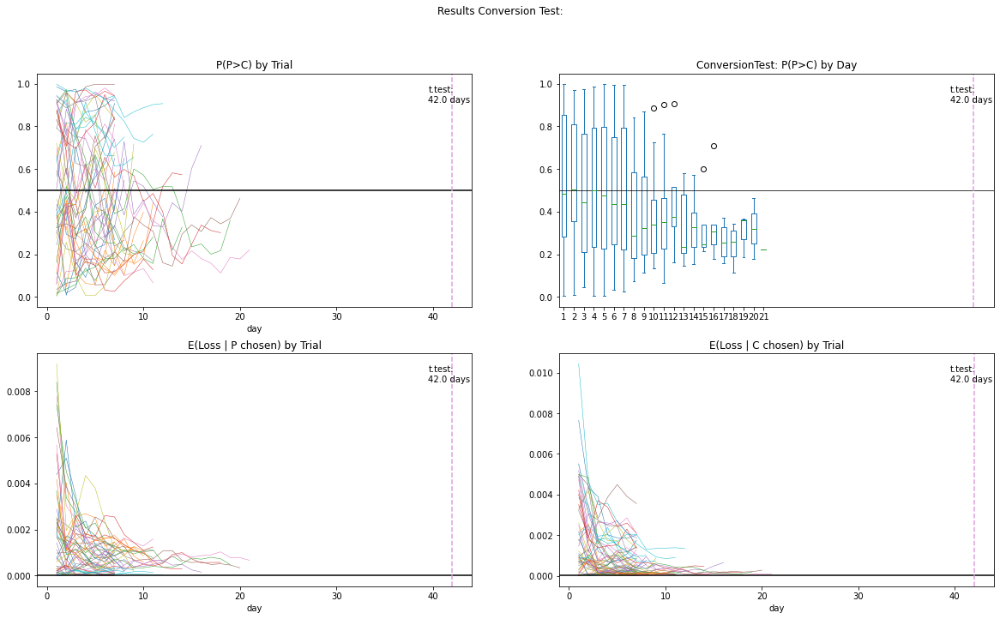

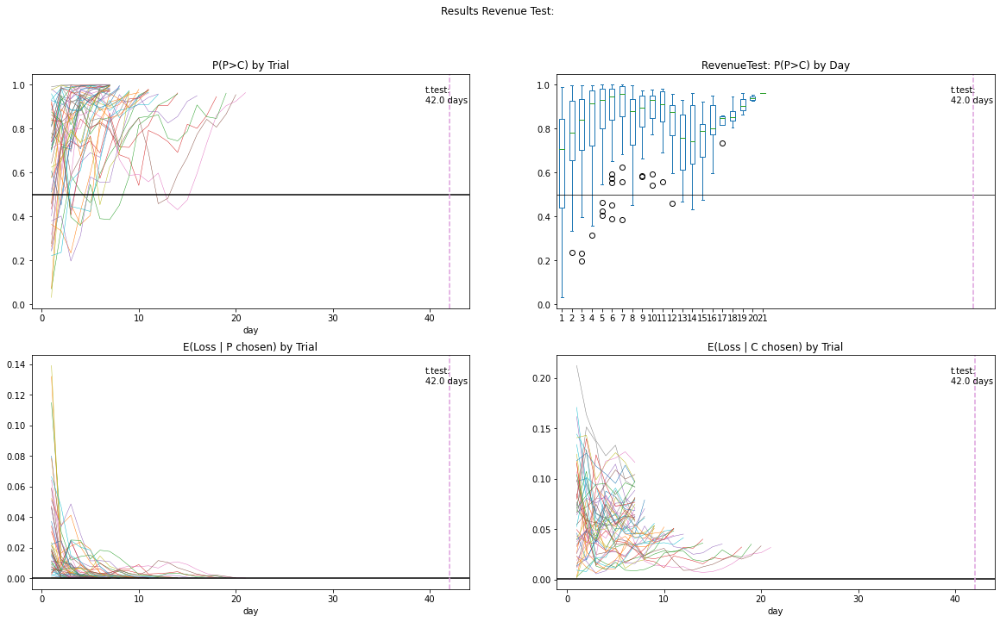

p    50
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.02,0.0,1.0,0.0,0.0
False,0.98,1.0,0.0,1.0,1.0


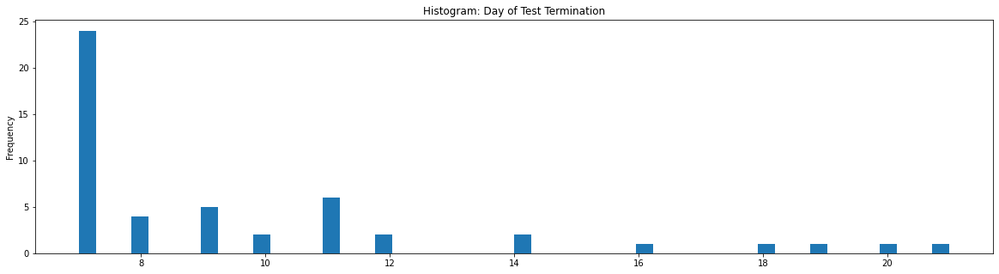

In [211]:
c_nU_yU_4[2].to_pickle("./sims_data/c_nU_yU_4.pkl")
# c_nU_yU_4 = pd.read_pickle("./sims_data/c_nU_yU_4.pkl")

plot_results(c_nU_yU_4[0], "Conversion", stop_rule_con)
plot_results(c_nU_yU_4[1], "Revenue", stop_rule_rev)
c_nU_yU_4[2].day.plot(kind = "hist", bins = 50, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_yU_4[2].revenue_win.value_counts())
c_nU_yU_4[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/50

# Sims Sequential:

### Sims - Set Up:

In [77]:
def eval_data_seq(
    true_conv_rate: int,
    true_mean_of_logs_of_spend: int,
    true_variance_of_logs_of_spend: int,
    con_multi: int,
    rev_multi: int,
    n_daily_users: int,
    split_ratio: int,
    n_days: int,
    stop_rule_con: int,
    stop_rule_rev: int,
    trial: int,
) -> list:
    df_c = get_data(
        n_daily_users = int(n_daily_users*split_ratio),
        n_days = n_days,
        true_conv_rate = true_conv_rate,
        true_mean_of_logs_of_spend = true_mean_of_logs_of_spend,
        true_variance_of_logs_of_spend = true_variance_of_logs_of_spend,
        test_gr = "c"
    )
    df_p = get_data(
        n_daily_users = n_daily_users-int(n_daily_users*split_ratio),
        n_days = n_days,
        true_conv_rate = true_conv_rate * con_multi,
        true_mean_of_logs_of_spend = true_mean_of_logs_of_spend + np.log(rev_multi),
        true_variance_of_logs_of_spend = true_variance_of_logs_of_spend,
        test_gr = "p"
    )
    data_df = pd.concat([df_c, df_p])
    dates_list = [x+1 for x in range(n_days)]
    
    a_prior_conv_test_C = 1
    b_prior_conv_test_C = 1
    a_prior_conv_test_P = 1
    b_prior_conv_test_P = 1

    a_prior_beta_revenue_test_P = 1
    b_prior_beta_revenue_test_P = 1
    m_prior_revenue_test_P = 1.8
    a_prior_ig_revenue_test_P = 11
    b_prior_ig_revenue_test_P = 20
    w_prior_revenue_test_P = 10

    a_prior_beta_revenue_test_C = 1
    b_prior_beta_revenue_test_C = 1
    m_prior_revenue_test_C = 1.8
    a_prior_ig_revenue_test_C = 11
    b_prior_ig_revenue_test_C = 20
    w_prior_revenue_test_C = 10
    
    con_results = []
    rev_results = []
    
    for current_date in dates_list:
        try:
            daily_data = data_df[data_df.meta_date == current_date].copy()
            daily_data['conversions'] = daily_data['total_wins_spend'] > 0
            df_P = daily_data.loc[
                (daily_data["test_group"].str.lower() == "p") | (daily_data["test_group"].str.lower() == "assetario")
            ]
            df_C = daily_data.loc[
                (daily_data["test_group"].str.lower() == "c") | (daily_data["test_group"].str.lower() == "control")
            ]

            #################################################################
            # CONVERSION RATE TEST
            test_conversion = BinaryDataTest()

            test_conversion.add_variant_data(name = "P", data = df_P["conversions"].values, a_prior = a_prior_conv_test_P, b_prior = b_prior_conv_test_P)
            test_conversion.add_variant_data(name = "C", data = df_C["conversions"].values, a_prior = a_prior_conv_test_C, b_prior = b_prior_conv_test_C)

            a_prior_conv_test_P = test_conversion.data['P']['a_posterior']
            b_prior_conv_test_P = test_conversion.data['P']['b_posterior']
            a_prior_conv_test_C = test_conversion.data['C']['a_posterior']
            b_prior_conv_test_C = test_conversion.data['C']['b_posterior']

            res_conv_test = test_conversion.evaluate(seed=42)
            con_results.append(
                [
                    trial,
                    current_date,
                    res_conv_test[0]['prob_being_best'],
                    res_conv_test[0]["expected_loss"],
                    res_conv_test[1]['prob_being_best'],
                    res_conv_test[1]["expected_loss"],
                ]
            )
            #################################################################

            #################################################################
            # REVENUE TEST
            test_revenue = DeltaLognormalDataTest()
            test_revenue.add_variant_data(name = "P", data = df_P["total_wins_spend"].values, a_prior_beta = a_prior_beta_revenue_test_P, b_prior_beta = b_prior_beta_revenue_test_P, 
                                            m_prior = m_prior_revenue_test_P, a_prior_ig = a_prior_ig_revenue_test_P, b_prior_ig = b_prior_ig_revenue_test_P, w_prior = w_prior_revenue_test_P)
            test_revenue.add_variant_data(name = "C", data = df_C["total_wins_spend"].values, a_prior_beta = a_prior_beta_revenue_test_C, b_prior_beta = b_prior_beta_revenue_test_C, 
                                            m_prior = m_prior_revenue_test_C, a_prior_ig = a_prior_ig_revenue_test_C, b_prior_ig = b_prior_ig_revenue_test_C, w_prior = w_prior_revenue_test_C)

            a_prior_beta_revenue_test_P = test_revenue.data['P']['a_post_beta']
            b_prior_beta_revenue_test_P = test_revenue.data['P']['b_post_beta']
            m_prior_revenue_test_P = test_revenue.data['P']['m_post']
            a_prior_ig_revenue_test_P = test_revenue.data['P']['a_post_ig']
            b_prior_ig_revenue_test_P = test_revenue.data['P']['b_post_ig']
            w_prior_revenue_test_P = test_revenue.data['P']['w_post']

            a_prior_beta_revenue_test_C = test_revenue.data['C']['a_post_beta']
            b_prior_beta_revenue_test_C = test_revenue.data['C']['b_post_beta']
            m_prior_revenue_test_C = test_revenue.data['C']['m_post']
            a_prior_ig_revenue_test_C = test_revenue.data['C']['a_post_ig']
            b_prior_ig_revenue_test_C = test_revenue.data['C']['b_post_ig']
            w_prior_revenue_test_C = test_revenue.data['C']['w_post']

            res_revenue_test = test_revenue.evaluate(seed=42)
            rev_results.append(
                [
                    trial,
                    current_date,
                    res_revenue_test[0]['prob_being_best'],
                    res_revenue_test[0]["expected_loss"],
                    res_revenue_test[1]['prob_being_best'],
                    res_revenue_test[1]["expected_loss"],
                ]
            )
            #################################################################

            #################################################################
            # EARLY STOP
            stop_con_c = res_conv_test[1]["expected_loss"] <= stop_rule_con
            stop_con_p = res_conv_test[0]["expected_loss"] <= stop_rule_con
            stop_rev_c = res_revenue_test[1]["expected_loss"] <= stop_rule_con
            stop_rev_p = res_revenue_test[0]["expected_loss"] <= stop_rule_con
            
            if (
                (current_date >= 7) and
                (
                    (stop_con_c) or (stop_con_p) or (stop_rev_c) or (stop_rev_p)
                )
               ):
                spend_by_group = data_df[data_df['meta_date'] <= current_date].groupby("test_group").sum().total_wins_spend
                count_by_group = data_df[data_df['meta_date'] == 1].groupby("test_group").count().meta_date
                arpu_by_group  = spend_by_group/count_by_group
                
                
                if (stop_con_p or stop_rev_p) and (stop_con_c or stop_rev_c):
                    revenue_win = arpu_by_group.idxmax()
                elif (stop_con_p or stop_rev_p):
                    revenue_win = "p"
                elif (stop_con_c or stop_rev_c):
                    revenue_win = "c"
                else:
                    revenue_win = "error"
                what_stop = {
                    "trial":trial,
                    "day":current_date,
                    "con_p":stop_con_p,
                    "con_c":stop_con_c,
                    "rev_p":stop_rev_p,
                    "rev_c":stop_rev_c,
                    "revenue_win":revenue_win,
                    "time":False,
                }
                return [con_results, rev_results, what_stop]
            #################################################################
        except:
            con_results.append(
                [
                    trial,
                    current_date,
                    None,
                    None,
                    None,
                    None,
                ]
            )
            rev_results.append(
                [
                    trial,
                    current_date,
                    None,
                    None,
                    None,
                    None,
                ]
            )
    what_stop = {
        "trial":trial,
        "day":current_date,
        "con_p":False,
        "con_c":False,
        "rev_p":False,
        "rev_c":False,
        "revenue_win":"time",
        "time":True,
    }
    
    return [con_results, rev_results, what_stop]

In [78]:
def get_all_seq(
    n_trials:int,
    stop_rule_con:float,
    stop_rule_rev:float,
    con_multi:float,
    rev_multi:float,
    n_days: int = 30,
    verbose:bool = True,
    verbose_num: int = 5,
) -> list:
    con_res = pd.DataFrame(
        None,
        columns=[
            "trial",
            "day",
            "prob_being_best_p",
            "expected_loss_p",
            "prob_being_best_c",
            "expected_loss_c",
        ],
    )
    rev_res = pd.DataFrame(
        None,
        columns=[
            "trial",
            "day",
            "prob_being_best_p",
            "expected_loss_p",
            "prob_being_best_c",
            "expected_loss_c",
        ],
    )
    stop_res = pd.DataFrame(
        None,
        columns=[
            "trial",
            "day",
            "con_p",
            "con_c",
            "rev_p",
            "rev_c",
            "revenue_win",
            "time",
        ],
    )

    for trial in range(0, n_trials):
        temp_trial = eval_data_seq(
            true_conv_rate=0.03,
            true_mean_of_logs_of_spend=1.8,
            true_variance_of_logs_of_spend=np.sqrt(2),
            con_multi=con_multi,
            rev_multi=rev_multi,
            n_daily_users=10000,
            split_ratio=0.5,
            n_days=n_days,
            stop_rule_con=stop_rule_con,
            stop_rule_rev=stop_rule_rev,
            trial=trial,
        )
        
        temp_con_res = pd.DataFrame(
            temp_trial[0],
            columns=[
                "trial",
                "day",
                "prob_being_best_p",
                "expected_loss_p",
                "prob_being_best_c",
                "expected_loss_c",
            ],
        )
        temp_rev_res = pd.DataFrame(
            temp_trial[1],
            columns=[
                "trial",
                "day",
                "prob_being_best_p",
                "expected_loss_p",
                "prob_being_best_c",
                "expected_loss_c",
            ],
        )
        temp_stop_res = pd.DataFrame(
            temp_trial[2],
            columns=[
                "trial",
                "day",
                "con_p",
                "con_c",
                "rev_p",
                "rev_c",
                "revenue_win",
                "time",
            ],
            index = [trial],
        )
        
        con_res = pd.concat([con_res, temp_con_res], ignore_index=True)
        rev_res = pd.concat([rev_res, temp_rev_res], ignore_index=True)
        stop_res = pd.concat([stop_res, temp_stop_res], ignore_index=True)
        
        if verbose == True:
            if trial % verbose_num == 0:
                print("Trial" , str(trial) + "/" + str(n_trials))
    
    return([con_res, rev_res, stop_res])

In [79]:
def freq_counts(
    name: str
) -> list:
    temp_path = "./sims_data/" + name + ".pkl"
    temp = pd.read_pickle(temp_path)
    l = []
    for row in temp.itertuples(index=True, name='Pandas'):
        if (row.con_p or row.rev_p) and (row.con_c or row.rev_c):
            l.append(row.revenue_win)
        elif (row.con_p or row.rev_p):
            l.append("p")
        elif (row.con_c or row.rev_c):
            l.append("c")
        else:
            l.append(row.revenue_win)
    unique, counts = np.unique(np.asarray(l), return_counts=True)
    return(np.asarray((unique, counts)).T)

In [80]:
print(freq_counts("c_nU_yU_seq_1"))
print(freq_counts("c_nU_yU_seq_2"))
print(freq_counts("c_nU_yU_seq_3"))
print(freq_counts("c_nU_yU_seq_4"))
print(freq_counts("c_yU_nU_seq_1"))
print(freq_counts("c_yU_nU_seq_2"))
print(freq_counts("c_yU_nU_seq_3"))
print(freq_counts("c_yU_nU_seq_4"))
print(freq_counts("c_nU_nU_seq"))
print(freq_counts("c_nU_nU_nostop_seq"))
#freq_counts("c_yU_nU_seq_1")

[['c' '21']
 ['p' '42']
 ['time' '37']]
[['c' '20']
 ['p' '65']
 ['time' '15']]
[['c' '9']
 ['p' '90']
 ['time' '1']]
[['c' '5']
 ['p' '95']]
[['c' '14']
 ['p' '67']
 ['time' '19']]
[['c' '3']
 ['p' '93']
 ['time' '4']]
[['p' '100']]
[['p' '100']]
[['c' '33']
 ['p' '27']
 ['time' '40']]
[['c' '1']
 ['time' '99']]


### Sims - Constants:

In [81]:
# Question 7: Investigate if stopping rule is same or not...
stop_rule_con = 0.00001
stop_rule_rev = 0.0005
n_trials = 100
n_days = 42

### Sims - Null:

In [103]:
c_nU_nU_nostop_long = get_all_seq(
    n_trials = 100,
    stop_rule_con = 0,
    stop_rule_rev = 0,
    con_multi = 1,
    rev_multi = 1,
    n_days = 200,
    verbose = True,
    verbose_num = 2,
)

Trial 0/25
Trial 2/25
Trial 4/25
Trial 6/25
Trial 8/25
Trial 10/25
Trial 12/25
Trial 14/25
Trial 16/25
Trial 18/25
Trial 20/25
Trial 22/25
Trial 24/25


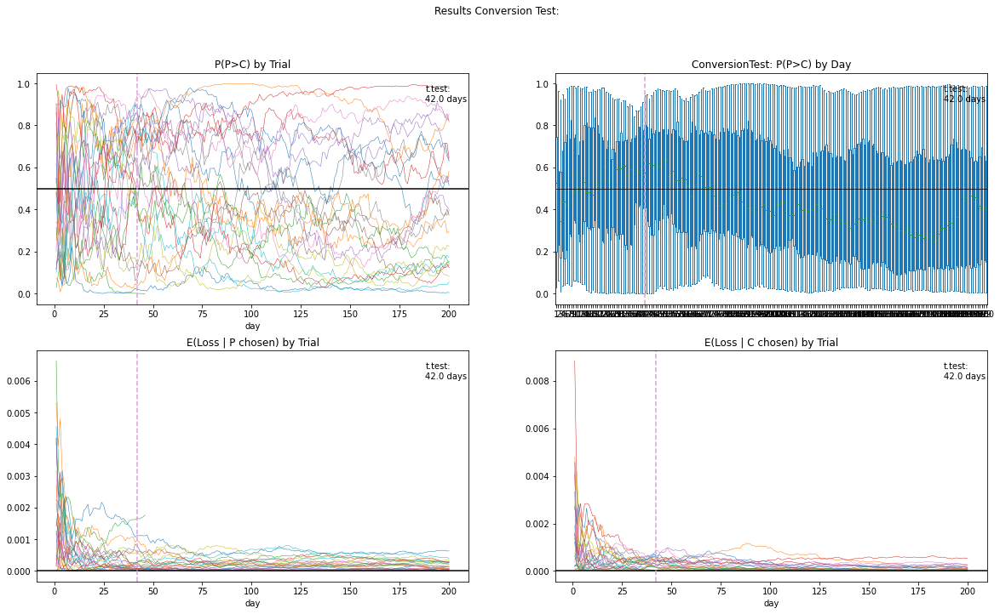

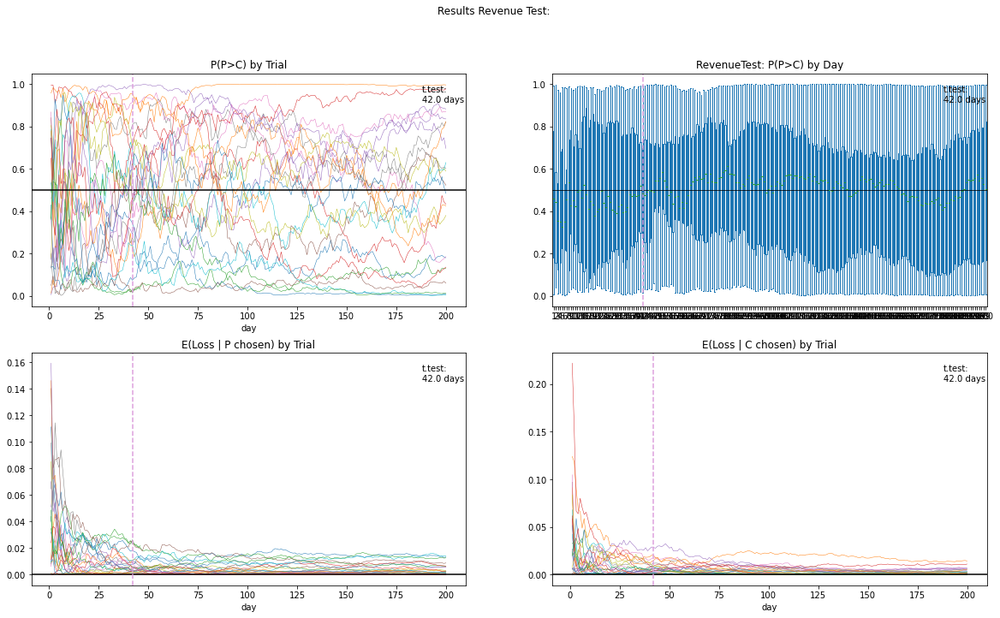

time    24
c        1
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,NaN,0.04,NaN,NaN,0.96
False,1.0,0.96,1.0,1.0,0.04


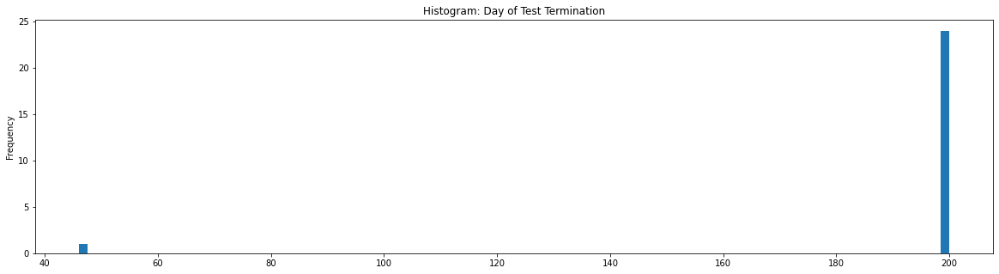

In [104]:
c_nU_nU_nostop_long[2].to_pickle("./sims_data/c_nU_nU_nostop_long_seq.pkl")
# c_nU_nU_nostop = pd.read_pickle("./sims_data/c_nU_nU_nostop_seq.pkl")

plot_results(c_nU_nU_nostop_long[0], "Conversion", stop_rule_con)
plot_results(c_nU_nU_nostop_long[1], "Revenue", stop_rule_rev)
c_nU_nU_nostop_long[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_nU_nostop_long[2].revenue_win.value_counts())
c_nU_nU_nostop_long[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).sort_index(ascending=False)/25

# Question 5: try min_sample_size for 
#             To begin I ran an A/A test comparing a sales process with a 5% conversion rate
#             and a mean of 25$ revenue/sale. In this example, the standard deviation of the
#             data is $5.6 (compared to a mean revenue/visitor of $1.25)

In [32]:
c_nU_nU_nostop = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = 0,
    stop_rule_rev = 0,
    con_multi = 1,
    rev_multi = 1,
    n_days = 100,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


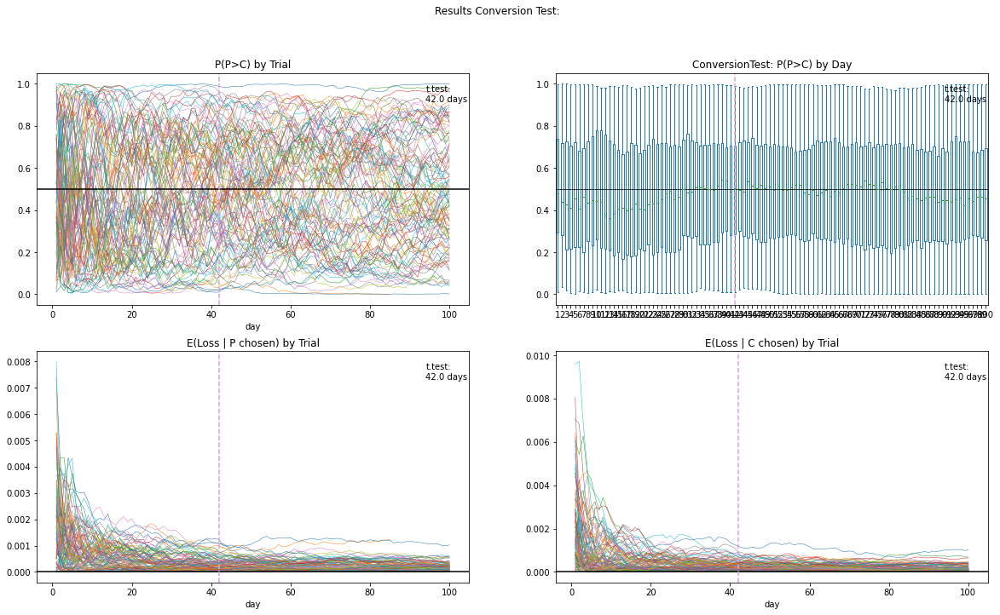

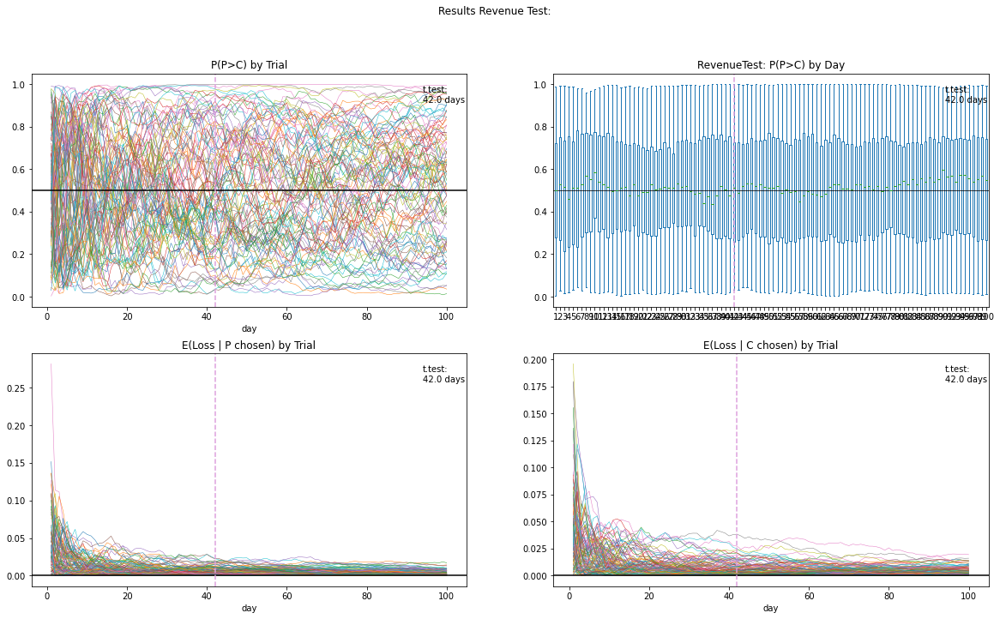

time    99
c        1
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,NaN,0.02,NaN,NaN,1.98
False,2.0,1.98,2.0,2.0,0.02


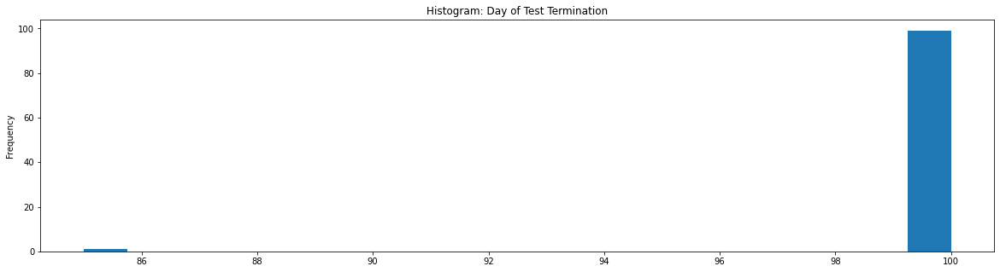

In [33]:
c_nU_nU_nostop[2].to_pickle("./sims_data/c_nU_nU_nostop_seq.pkl")
# c_nU_nU_nostop = pd.read_pickle("./sims_data/c_nU_nU_nostop_seq.pkl")

plot_results(c_nU_nU_nostop[0], "Conversion", stop_rule_con)
plot_results(c_nU_nU_nostop[1], "Revenue", stop_rule_rev)
c_nU_nU_nostop[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_nU_nostop[2].revenue_win.value_counts())
c_nU_nU_nostop[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).sort_index(ascending=False)/n_trials

# Question 5: try min_sample_size for 
#             To begin I ran an A/A test comparing a sales process with a 5% conversion rate
#             and a mean of 25$ revenue/sale. In this example, the standard deviation of the
#             data is $5.6 (compared to a mean revenue/visitor of $1.25)

In [113]:
c_nU_nU = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1,
    n_days = n_days,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


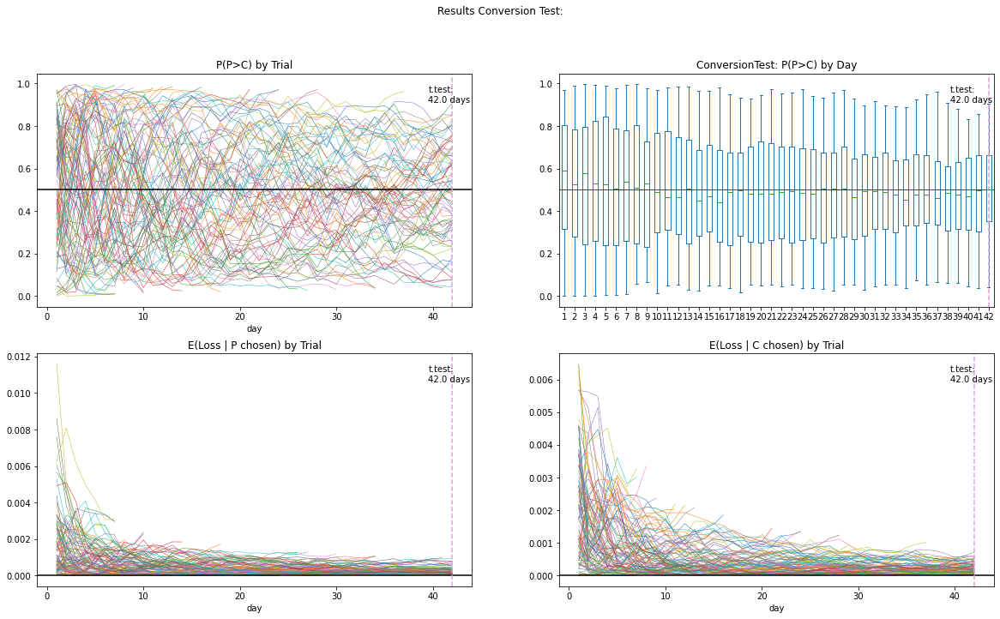

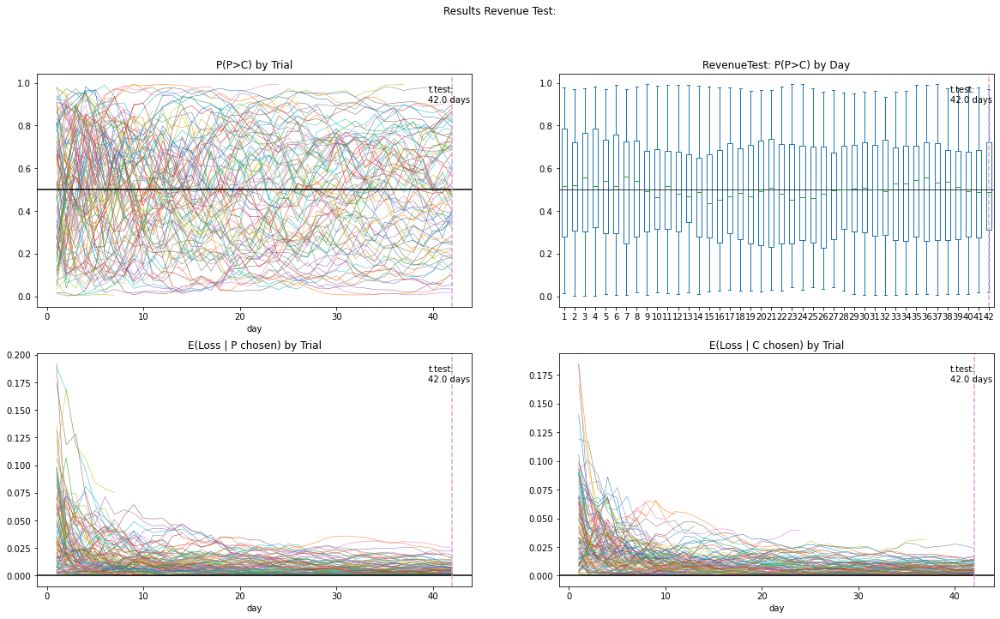

time    71
c       15
p       14
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.14,0.15,NaN,NaN,0.71
False,0.86,0.85,1.0,1.0,0.29


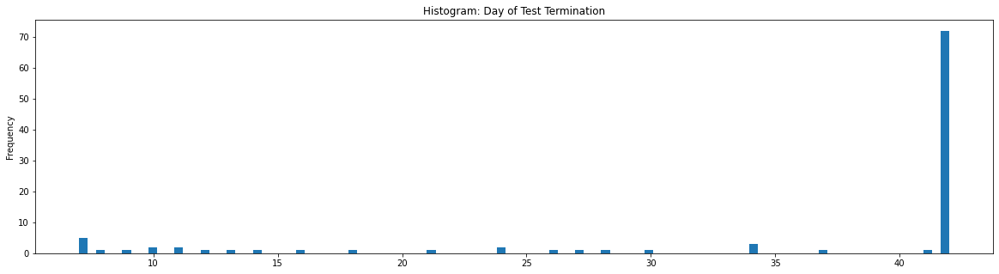

In [114]:
c_nU_nU[2].to_pickle("./sims_data/c_nU_nU_seq.pkl")
# c_nU_nU = pd.read_pickle("./sims_data/c_nU_nU_seq.pkl")

plot_results(c_nU_nU[0], "Conversion", stop_rule_con)
plot_results(c_nU_nU[1], "Revenue", stop_rule_rev)
c_nU_nU[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_nU[2].revenue_win.value_counts())
c_nU_nU[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).sort_index(ascending=False)/n_trials

# Question 5: try min_sample_size for 
#             To begin I ran an A/A test comparing a sales process with a 5% conversion rate
#             and a mean of 25$ revenue/sale. In this example, the standard deviation of the
#             data is $5.6 (compared to a mean revenue/visitor of $1.25)

### Sims - Conversion:

In [84]:
c_yU_nU_1 = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1.025,
    rev_multi = 1,
    n_days = n_days,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


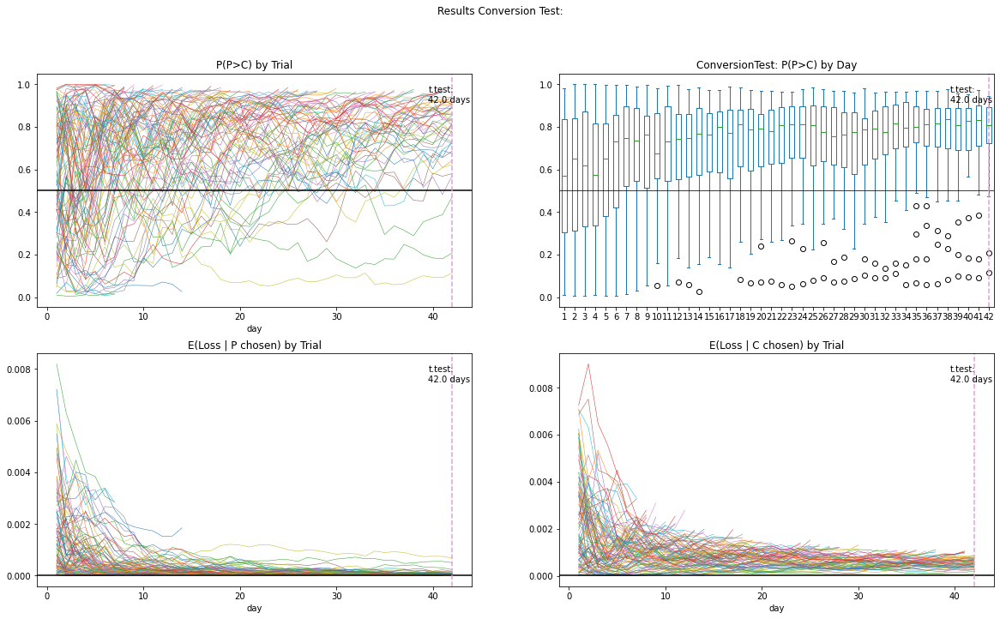

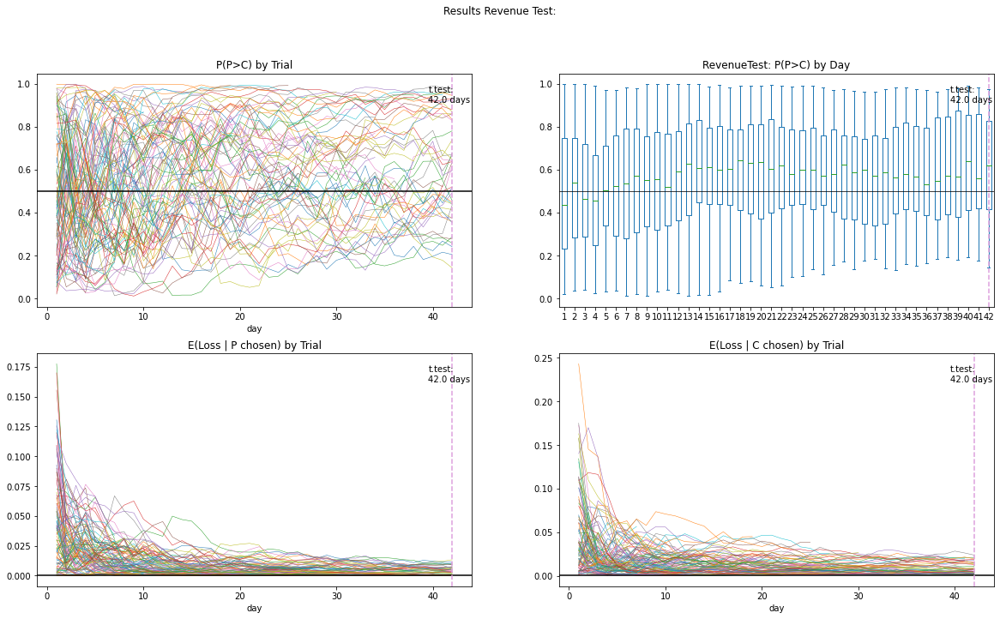

p       56
time    41
c        3
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.56,0.03,0.0,0.0,0.41
False,0.44,0.97,1.0,1.0,0.59


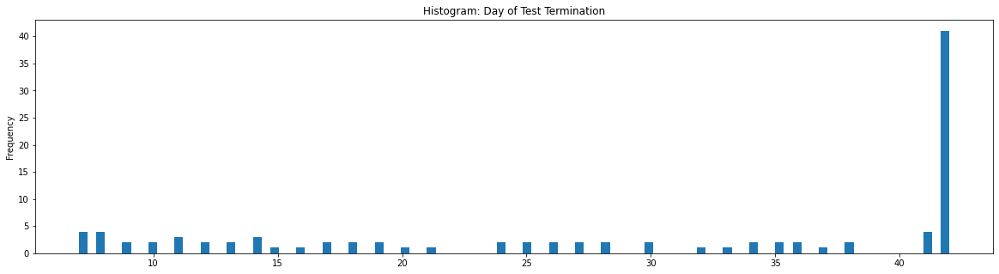

In [85]:
c_yU_nU_1[2].to_pickle("./sims_data/c_yU_nU_seq_1.pkl")
# c_yU_nU_1 = pd.read_pickle("./sims_data/c_yU_nU_seq_1.pkl")

plot_results(c_yU_nU_1[0], "Conversion", stop_rule_con)
plot_results(c_yU_nU_1[1], "Revenue", stop_rule_rev)
c_yU_nU_1[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_yU_nU_1[2].revenue_win.value_counts())
c_yU_nU_1[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/n_trials

In [86]:
c_yU_nU_2 = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1.05,
    rev_multi = 1,
    n_days = n_days,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


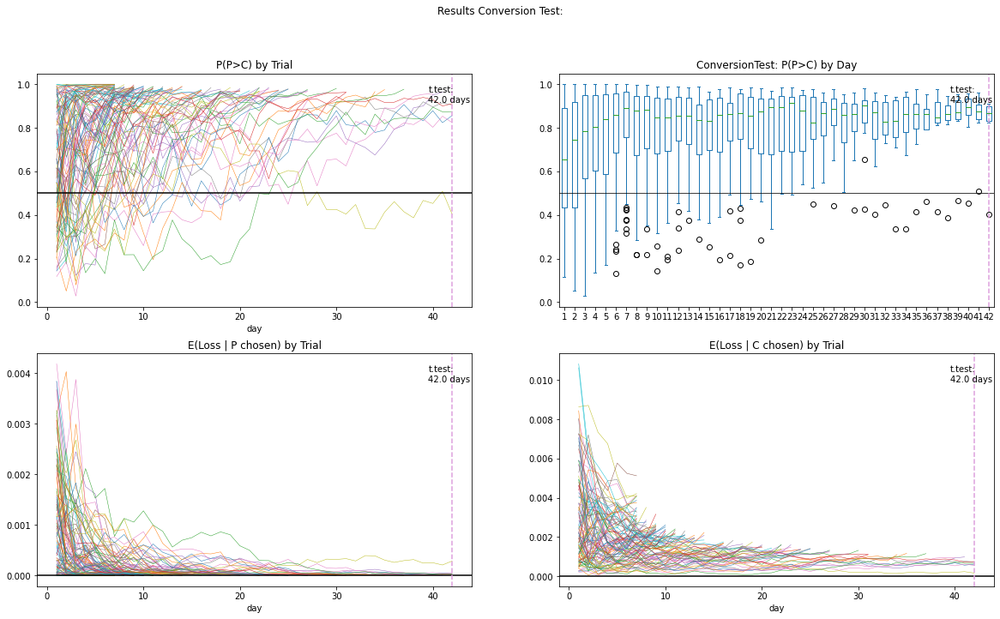

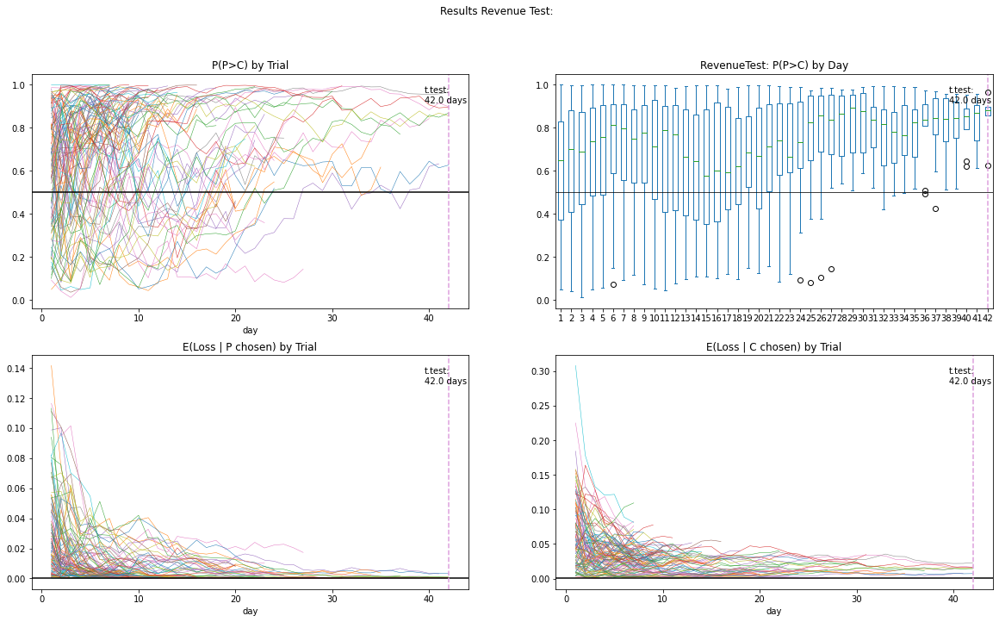

p       94
time     6
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.93,0.0,0.02,0.0,0.06
False,0.07,1.0,0.98,1.0,0.94


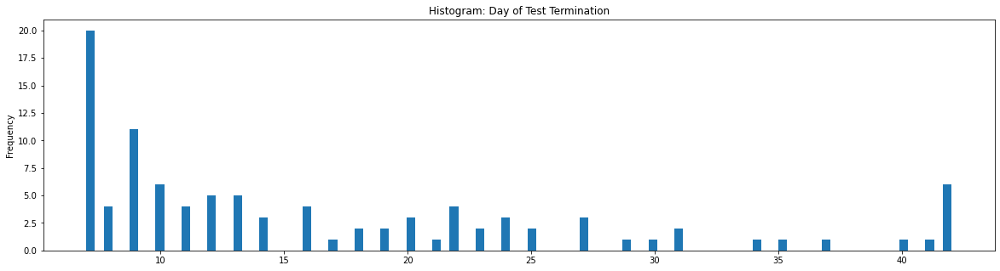

In [87]:
c_yU_nU_2[2].to_pickle("./sims_data/c_yU_nU_seq_2.pkl")
# c_yU_nU_2 = pd.read_pickle("./sims_data/c_yU_nU_seq_2.pkl")

plot_results(c_yU_nU_2[0], "Conversion", stop_rule_con)
plot_results(c_yU_nU_2[1], "Revenue", stop_rule_rev)
c_yU_nU_2[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_yU_nU_2[2].revenue_win.value_counts())
c_yU_nU_2[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/n_trials

In [88]:
c_yU_nU_3 = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1.1,
    rev_multi = 1,
    n_days = n_days,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


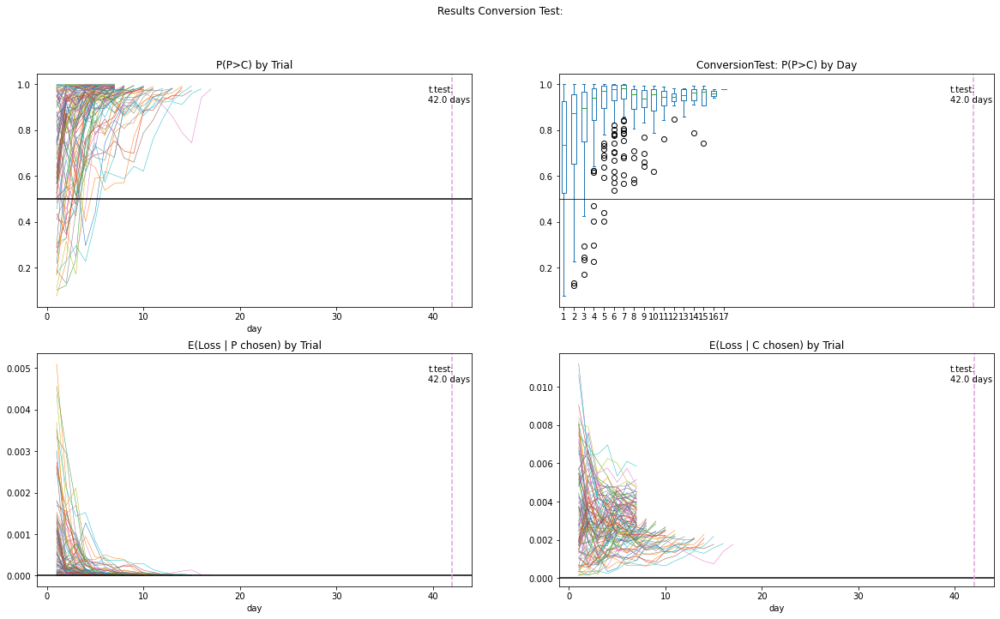

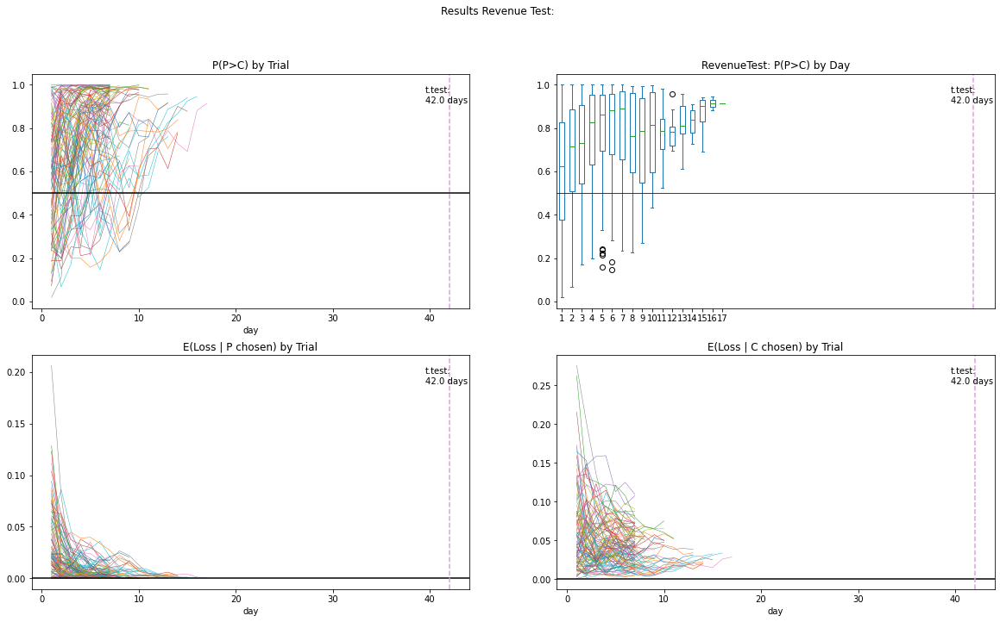

p    100
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.99,0.0,0.03,0.0,0.0
False,0.01,1.0,0.97,1.0,1.0


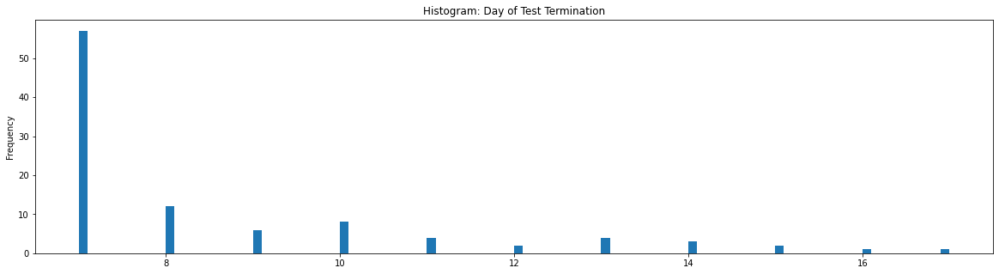

In [89]:
c_yU_nU_3[2].to_pickle("./sims_data/c_yU_nU_seq_3.pkl")
# c_yU_nU_3 = pd.read_pickle("./sims_data/c_yU_nU_seq_3.pkl")

plot_results(c_yU_nU_3[0], "Conversion", stop_rule_con)
plot_results(c_yU_nU_3[1], "Revenue", stop_rule_rev)
c_yU_nU_3[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_yU_nU_3[2].revenue_win.value_counts())
c_yU_nU_3[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/n_trials

In [90]:
c_yU_nU_4 = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1.15,
    rev_multi = 1,
    n_days = n_days,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


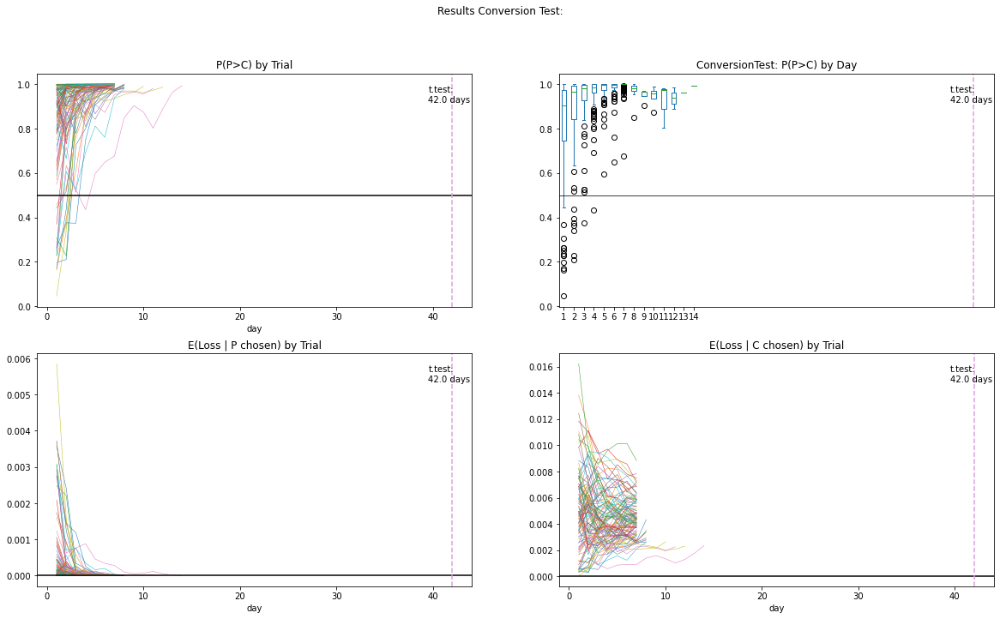

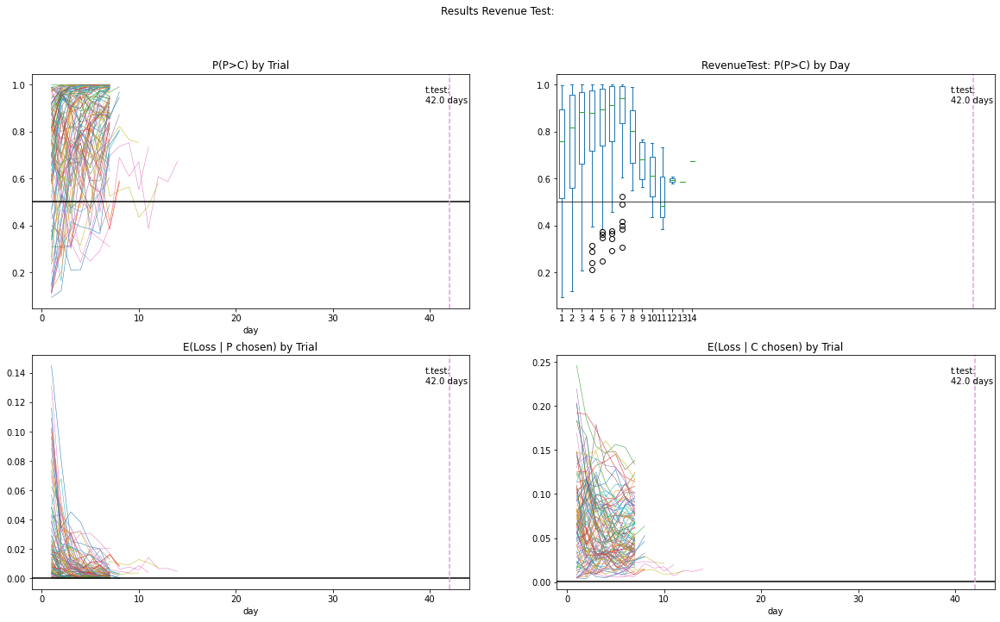

p    100
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,1.0,0.0,0.17,0.0,0.0
False,0.0,1.0,0.83,1.0,1.0


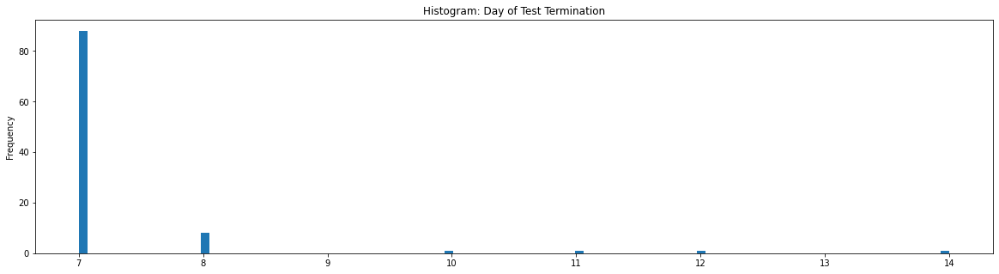

In [91]:
c_yU_nU_4[2].to_pickle("./sims_data/c_yU_nU_seq_4.pkl")
# c_yU_nU_4 = pd.read_pickle("./sims_data/c_yU_nU_seq_4.pkl")

plot_results(c_yU_nU_4[0], "Conversion", stop_rule_con)
plot_results(c_yU_nU_4[1], "Revenue", stop_rule_rev)
c_yU_nU_4[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_yU_nU_4[2].revenue_win.value_counts())
c_yU_nU_4[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/n_trials

### Sims - Revenue:

Text(0.5, 0.98, 'Histogram: Day of Test Termination')

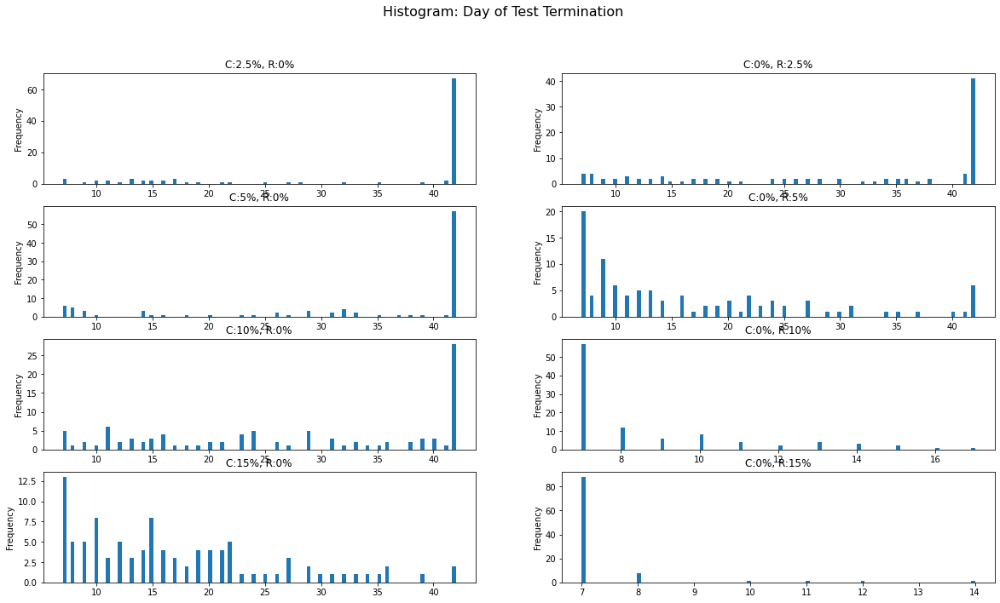

In [101]:
fig, axes = plt.subplots(nrows = 4, ncols = 2)
c_nU_yU_1[2].day.plot(kind = "hist", bins = 100, title = "C:2.5%, R:0%", legend = None, ax = axes[0, 0])
c_nU_yU_2[2].day.plot(kind = "hist", bins = 100, title = "C:5%, R:0%", legend = None, ax = axes[1, 0])
c_nU_yU_3[2].day.plot(kind = "hist", bins = 100, title = "C:10%, R:0%", legend = None, ax = axes[2, 0])
c_nU_yU_4[2].day.plot(kind = "hist", bins = 100, title = "C:15%, R:0%", legend = None, ax = axes[3, 0])

c_yU_nU_1[2].day.plot(kind = "hist", bins = 100, title = "C:0%, R:2.5%", legend = None, ax = axes[0, 1])
c_yU_nU_2[2].day.plot(kind = "hist", bins = 100, title = "C:0%, R:5%", legend = None, ax = axes[1, 1])
c_yU_nU_3[2].day.plot(kind = "hist", bins = 100, title = "C:0%, R:10%", legend = None, ax = axes[2, 1])
c_yU_nU_4[2].day.plot(kind = "hist", bins = 100, title = "C:0%, R:15%", legend = None, ax = axes[3, 1])

fig.suptitle('Histogram: Day of Test Termination', fontsize=16)

In [93]:
c_nU_yU_1 = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1.025,
    n_days = n_days,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


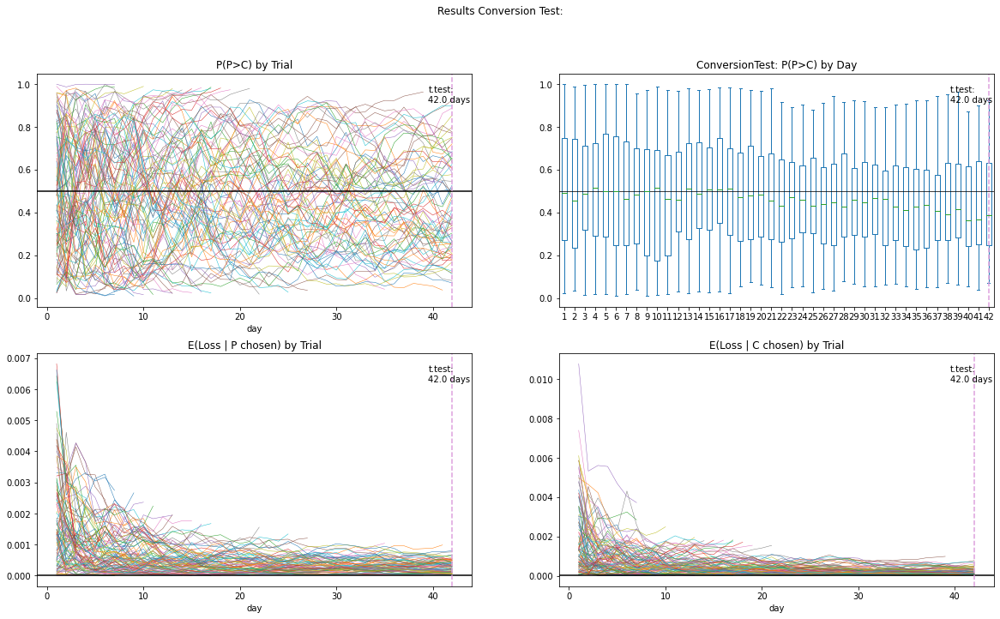

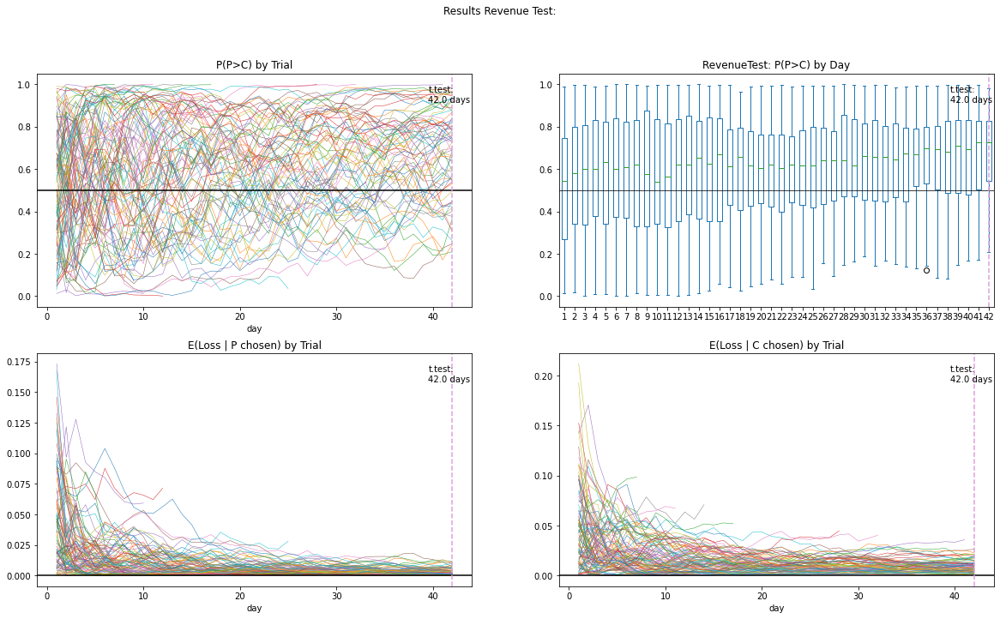

time    67
p       18
c       15
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.13,0.14,0.06,0.01,0.67
False,0.87,0.86,0.94,0.99,0.33


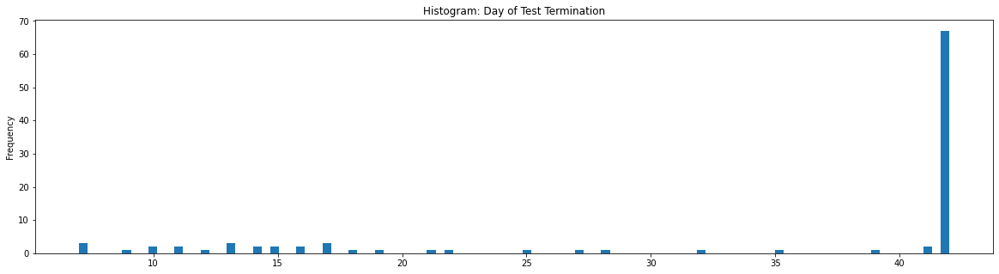

In [94]:
c_nU_yU_1[2].to_pickle("./sims_data/c_nU_yU_seq_1.pkl")
# c_nU_yU_1 = pd.read_pickle("./sims_data/c_nU_yU_seq_1.pkl")

plot_results(c_nU_yU_1[0], "Conversion", stop_rule_con)
plot_results(c_nU_yU_1[1], "Revenue", stop_rule_rev)
c_nU_yU_1[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_yU_1[2].revenue_win.value_counts())
c_nU_yU_1[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/n_trials

In [95]:
c_nU_yU_2 = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1.05,
    n_days = n_days,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


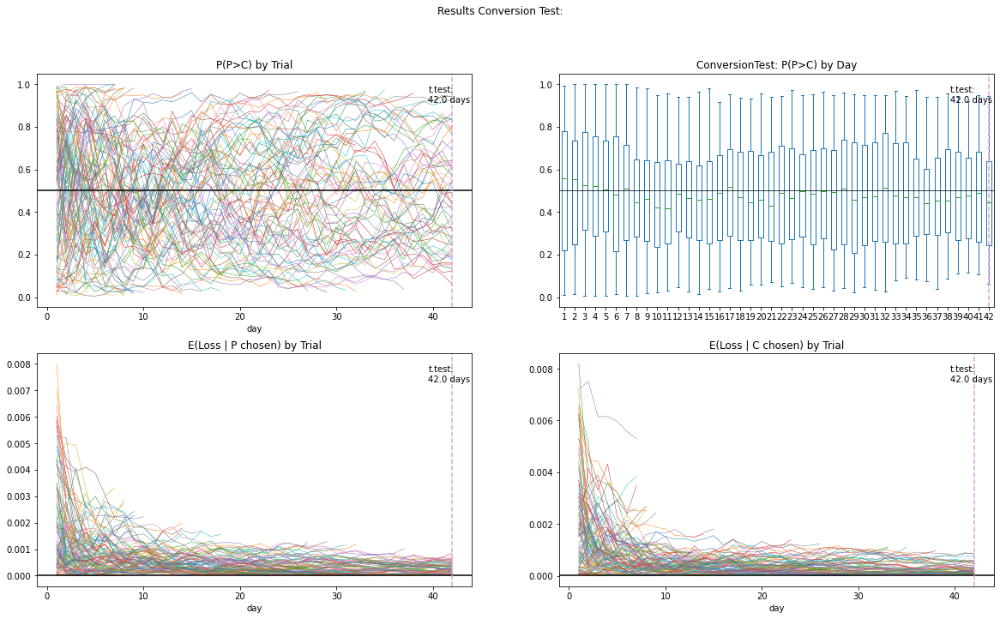

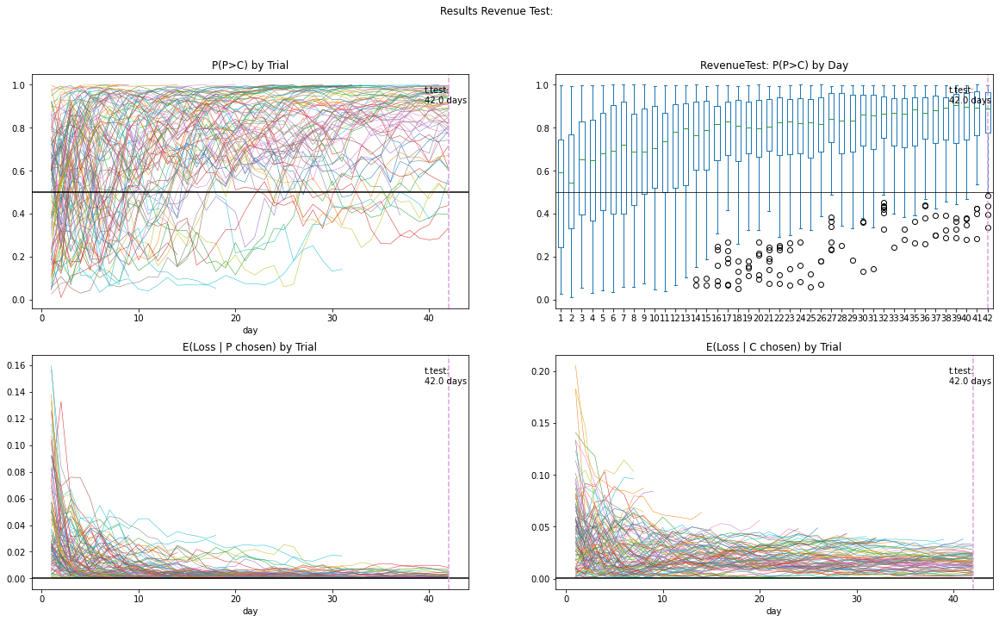

time    57
p       28
c       15
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.15,0.15,0.16,0.0,0.57
False,0.85,0.85,0.84,1.0,0.43


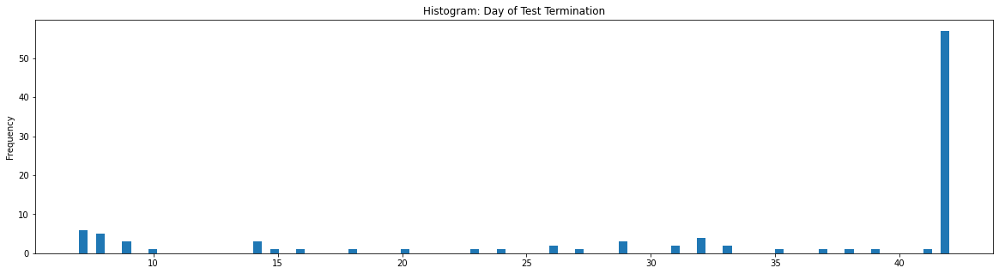

In [96]:
c_nU_yU_2[2].to_pickle("./sims_data/c_nU_yU_seq_2.pkl")
# c_nU_yU_2 = pd.read_pickle("./sims_data/c_nU_yU_seq_2.pkl")

plot_results(c_nU_yU_2[0], "Conversion", stop_rule_con)
plot_results(c_nU_yU_2[1], "Revenue", stop_rule_rev)
c_nU_yU_2[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_yU_2[2].revenue_win.value_counts())
c_nU_yU_2[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/n_trials

In [97]:
c_nU_yU_3 = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1.1,
    n_days = n_days,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


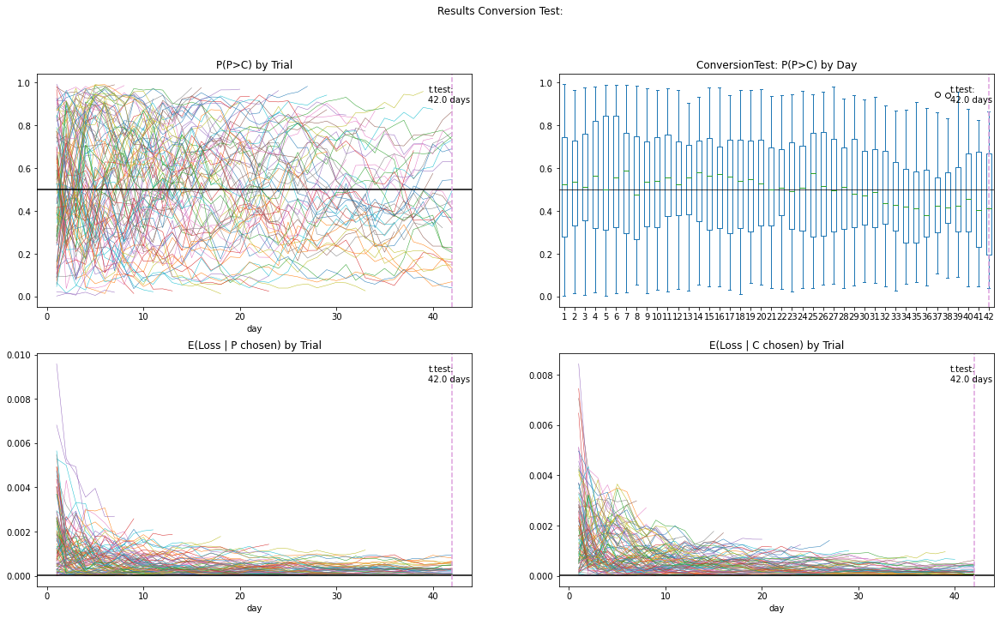

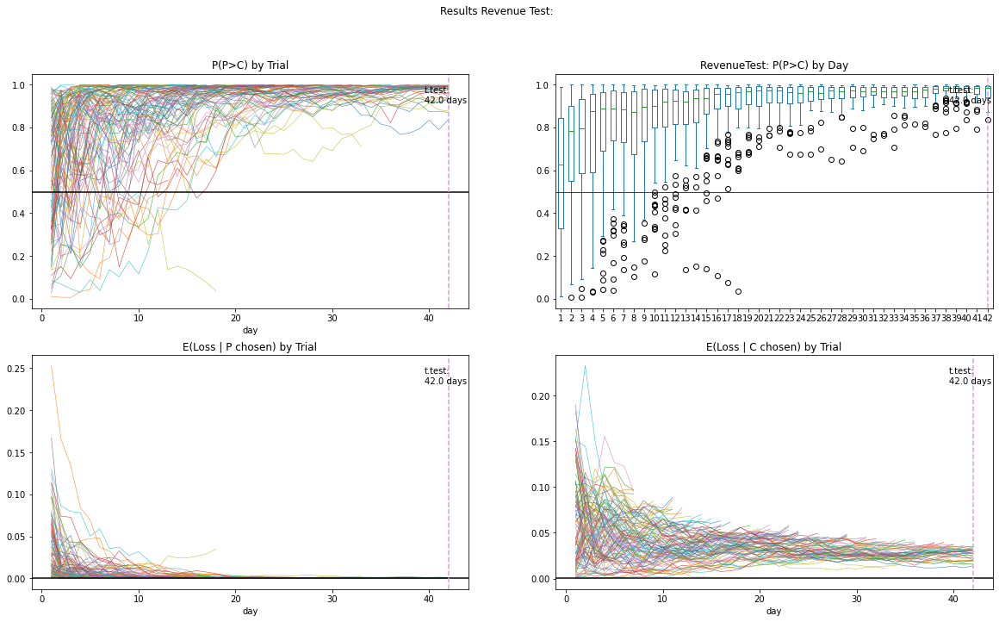

p       66
time    26
c        8
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.07,0.08,0.59,0.0,0.26
False,0.93,0.92,0.41,1.0,0.74


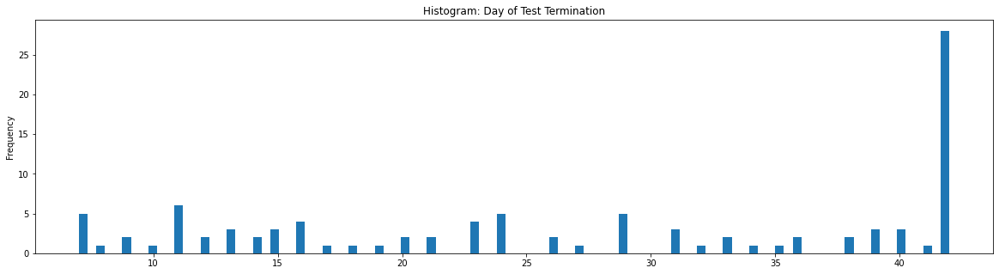

In [98]:
c_nU_yU_3[2].to_pickle("./sims_data/c_nU_yU_seq_3.pkl")
# c_nU_yU_3 = pd.read_pickle("./sims_data/c_nU_yU_seq_3.pkl")

plot_results(c_nU_yU_3[0], "Conversion", stop_rule_con)
plot_results(c_nU_yU_3[1], "Revenue", stop_rule_rev)
c_nU_yU_3[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_yU_3[2].revenue_win.value_counts())
c_nU_yU_3[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/n_trials

In [99]:
c_nU_yU_4 = get_all_seq(
    n_trials = n_trials,
    stop_rule_con = stop_rule_con,
    stop_rule_rev = stop_rule_rev,
    con_multi = 1,
    rev_multi = 1.15,
    n_days = n_days,
)

Trial 0/100
Trial 5/100
Trial 10/100
Trial 15/100
Trial 20/100
Trial 25/100
Trial 30/100
Trial 35/100
Trial 40/100
Trial 45/100
Trial 50/100
Trial 55/100
Trial 60/100
Trial 65/100
Trial 70/100
Trial 75/100
Trial 80/100
Trial 85/100
Trial 90/100
Trial 95/100


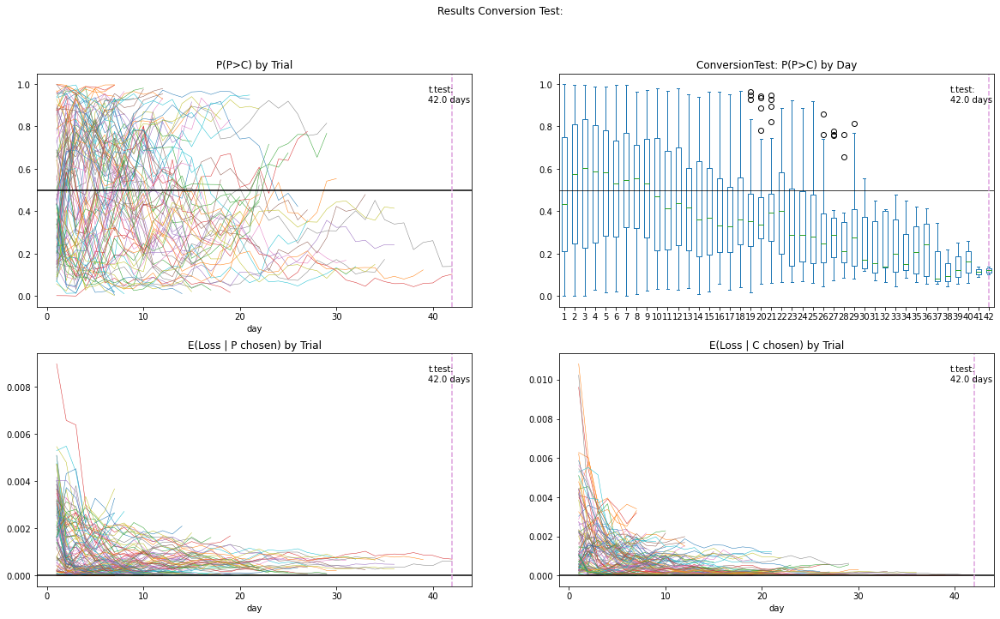

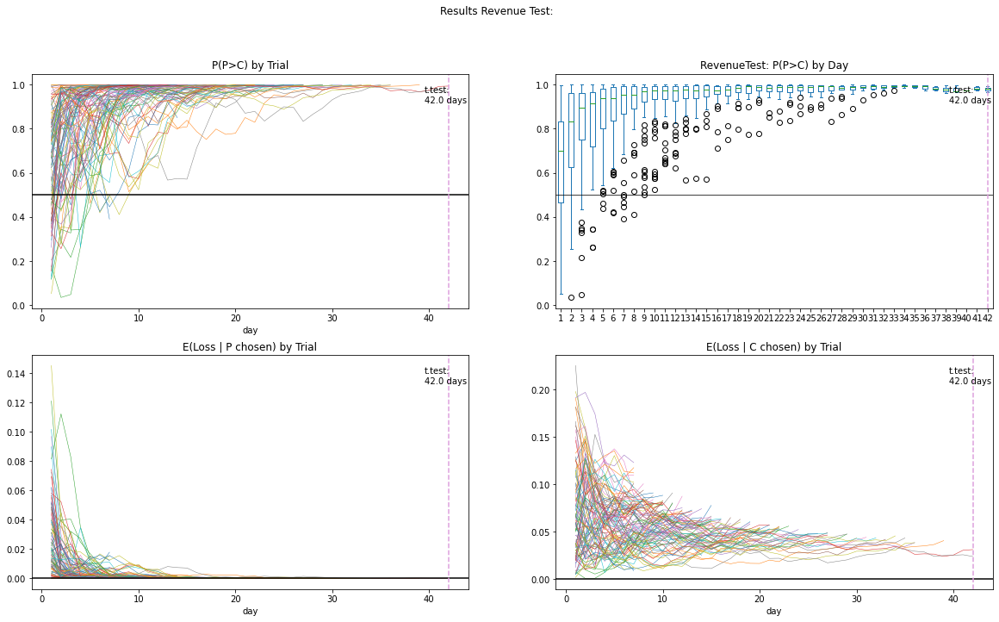

p       89
c        9
time     2
Name: revenue_win, dtype: int64


,con_p,con_c,rev_p,rev_c,time
True,0.05,0.09,0.85,0.0,0.02
False,0.95,0.91,0.15,1.0,0.98


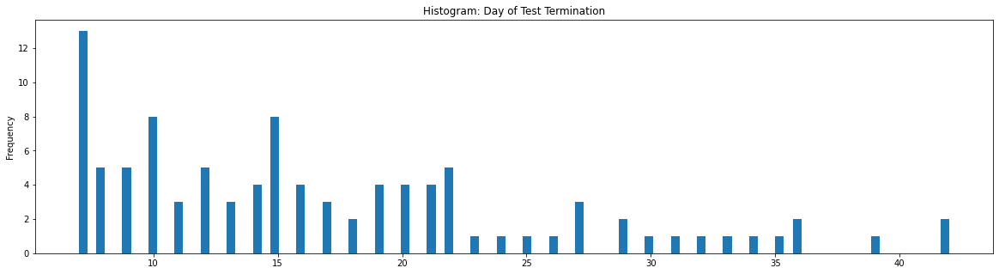

In [100]:
c_nU_yU_4[2].to_pickle("./sims_data/c_nU_yU_seq_4.pkl")
# c_nU_yU_4 = pd.read_pickle("./sims_data/c_nU_yU_seq_4.pkl")

plot_results(c_nU_yU_4[0], "Conversion", stop_rule_con)
plot_results(c_nU_yU_4[1], "Revenue", stop_rule_rev)
c_nU_yU_4[2].day.plot(kind = "hist", bins = n_trials, title = "Histogram: Day of Test Termination", legend = None, figsize=(20, 5))

print(c_nU_yU_4[2].revenue_win.value_counts())
c_nU_yU_4[2][['con_p','con_c','rev_p','rev_c','time']].apply(pd.value_counts).fillna(0).sort_index(ascending=False)/n_trials